### Modifying the base rLCE 

#### Anode Shadow

Add naive model for anode shadow to adjust maximum PMT ratio (https://xe1t-wiki.lngs.infn.it/doku.php?id=xenon:xenonnt:liangsx:s2_naive_anode_shadow)

The shadow start to finish on the PMT plane is denoted as $x_1'$ and $x_2'$. The radius of the anode wire is $r$, the S2 event position is $x$, $x_0$ is the center position of the anode wire.

The angle $\varphi$ denotes the angle between the straight line from the event site to the center of the anode wire and the line from event position to $x_1'$. The angle $\theta$ denotes the angle between the line connecting the event position and the anode wire center and the xy plane of the event site. $h$ denotes the distance between the anode center and the event $xy$ plane, this parameter has to be averaged as we can not infer this for all events (unless we fit it per event of course). And $H$ denotes the distance between the anode wire center and the PMT plane. Lastly $\alpha$ denotes the length from event site to the position where the projection to $x_1'$ touches the anode wire (Ie the hypotenuse formed by the triangle of lines event side to anode center at a right angle to the radius). $x_p$ denotes x coordinate of the PMT

$$
\sin\varphi = r/\alpha, \quad \tan\theta = h/(x_0-x) \\
x_1'= x + (tan(\theta-\phi))^{-1}\times x(H+h), \quad x_2' = x +(tan(\theta+\phi))^{-1}\times x(H+h)\\
Shadow Area = AR(x_1) - AR(x_2)\\
AR(x) =\begin{cases}
0, & x > x_{p+r}\\
\pi r^2, & x < x_{p-r}\\
\alpha r^2-(x-x_p)\sqrt{r^2-(x-x_p)^2}, & x_{p-r} < x < x_{p+r};\quad \alpha=\arccos(\frac{x-x_p}{r})\\
\end{cases}\\
coverage = \frac{Shadow Area}{PMT Area} \\
LCE_s = LCE(1-coverage \times opacity \times \exp(\frac{distance}{decay\_const})) \\
$$

Manually Rederived AR(x)

opacity and decay_const correspond to the tunable parameters. x is relative to a rotated coordinate frame

#### Add wall reflection term 

Teflon (PTFE) reflectivity is generally assumed to be quite high, somewhere around $0.95$. As such we will treat this value as constant since it doesnt seem to vary much. So we set $R=0.95$. We will set the PMT's as the zero position for now. 

I attempted deriving an analytical solution for specular reflection, however, this prooved very complicated, simulation worked find but one can not assume specular reflection, one could extend the code by adding a new source elemnt for each incidence point however then has to simulate n_iter*(n_photons) + (n_iter-1)*(n_photons)^2 + ...

An alternative method of determining the wall effect would be to either focus on MC simualtion and check the difference in wall reflection of simulation and my LCE response, or the difference of LCE response in the different models

### Simualte it - Specular Reflection $\theta_i = \theta_r$ 
Propagation for hitting the wall 
$$
t = \frac{-2(x_0d_x+y_0d_y)\pm \sqrt{4(x_0d_x+y_0d_y)^2-4(d_x^2 + d_y^2)(x_0^2 + y_0^2 - R^2)}}{2 (d_x^2 + d_y^2)}
$$

New path vector 
$$
d_{reflected} = d_{original} - 2 (d_{original} \cdot \hat{n}) \hat{n}
$$
where $\hat{n}= (x,y,0)/R$
And propagation for hitting the top is just solving for z 

So this was unsuccessfull as I need to simulate diffuse not specular reflection, Im just going to use all the maps available to solve for terms im lacking

In [1]:
"""
Working numpy implementation
"""
import numpy as np

def compute_vector_multiplier(pos, vec,max_z, min_z, R, tol=1e-8):
    """
    Propagates pos by vec until z limits or max radius is reached

    tol in case trivial solutions are found that arent exactly equal to zero 
    """
    # Compute vectors and replace negative with infinite, also all where div by zero occurs
    t_z_max = ((max_z - pos[...,-1]) / vec[...,-1])
    t_z_max = np.where((vec[..., 2] != 0) & (t_z_max > tol), t_z_max, np.inf)
    t_z_min = ((min_z - pos[...,-1]) / vec[...,-1])
    t_z_min = np.where((vec[..., 2] != 0) & (t_z_min > tol), t_z_min, np.inf)
    # Select minimum t for z
    t_z = np.minimum(t_z_min, t_z_max)
    # Compute minimum t for wall
    t_R_min = ( -2*(pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1]) - np.sqrt(4 * (pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1])**2  - 4*(vec[..., 0]**2 + vec[..., 1]**2) * (pos[..., 0]**2 + pos[..., 1]**2 - R**2) ) ) / (2 * (vec[..., 0]**2 + vec[..., 1]**2))
    t_R_max = ( -2*(pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1]) + np.sqrt(4 * (pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1])**2  - 4*(vec[..., 0]**2 + vec[..., 1]**2) * (pos[..., 0]**2 + pos[..., 1]**2 - R**2) ) ) / (2 * (vec[..., 0]**2 + vec[..., 1]**2))
    # Filter invalid and negative -> Sqrt should give nan and divisor inf and neg inf is handled by valid t 
    t_R_min = np.where((~np.isnan(t_R_min)) & (t_R_min > tol), t_R_min, np.inf)
    t_R_max = np.where((~np.isnan(t_R_max)) & (t_R_max > tol), t_R_max, np.inf)
    # Select minimum 
    t_R = np.minimum(t_R_min, t_R_max)
    # And overall minimum 
    return np.minimum(t_z, t_R)

def increment_vector(pos, vec, t, max_z, min_z, R, tol=1e-8):
    """
    Verifies new position is correct and increments

    tol for tolerance around tpc edges +-
    """

    new_pos = pos + t* vec

    z_cond = (new_pos[...,-1] <= (max_z+tol)) & (new_pos[...,-1] >= (min_z-tol)) 
    wall_cond = ((new_pos[...,0]**2 + new_pos[...,1]**2) <= (R+tol)**2)

    valid = z_cond & wall_cond
    pos = np.where(valid, new_pos, pos)

    # Update vectors 
    normal = pos[..., :] / R
    normal[...,2] = 0
    new_vec = vec - 2*((normal * vec).sum(axis=-1)) * normal

    # Compute points still within tpc - opposite tolerance as z_cond
    within_Cylinder = (pos[...,-1] < (max_z-tol)) & (pos[...,-1] > (min_z+tol)) 
    vec = np.where(within_Cylinder, new_vec, vec) 

    return pos, vec, within_Cylinder


pos = np.array([0,0,0])
vec = np.array([0,1,1])

t = compute_vector_multiplier(pos, vec,1, -1, 1)
pos, vec, within_Cylinder = increment_vector(pos, vec, t, 1, -1, 1)

In [2]:
"""
Working JAX implementation
"""
import numpy as np
import jax.numpy as jnp
from jax import jit

#@jit
def compute_vector_multiplier(pos, vec,max_z, min_z, R, tol=1e-8):
    """
    Propagates pos by vec until z limits or max radius is reached

    tol in case trivial solutions are found that arent exactly equal to zero 
    """
    # Compute vectors and replace negative with infinite, also all where div by zero occurs
    t_z_max = ((max_z - pos[...,-1]) / vec[...,-1])
    t_z_max = jnp.where(((vec[..., 2] != 0) & (t_z_max > tol)), t_z_max, np.inf)
    t_z_min = ((min_z - pos[...,-1]) / vec[...,-1])
    t_z_min = jnp.where(((vec[..., 2] != 0) & (t_z_min > tol)), t_z_min, np.inf)
    # Select minimum t for z
    t_z = jnp.minimum(t_z_min, t_z_max)
    # Compute minimum t for wall
    t_R_min = ( -2*(pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1]) - jnp.sqrt(4 * (pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1])**2  - 4*(vec[..., 0]**2 + vec[..., 1]**2) * (pos[..., 0]**2 + pos[..., 1]**2 - R**2) ) ) / (2 * (vec[..., 0]**2 + vec[..., 1]**2))
    t_R_max = ( -2*(pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1]) + jnp.sqrt(4 * (pos[..., 0]*vec[..., 0] + pos[..., 1]*vec[..., 1])**2  - 4*(vec[..., 0]**2 + vec[..., 1]**2) * (pos[..., 0]**2 + pos[..., 1]**2 - R**2) ) ) / (2 * (vec[..., 0]**2 + vec[..., 1]**2))
    # Filter invalid and negative -> Sqrt should give nan and divisor inf and neg inf is handled by valid t 
    t_R_min = jnp.where(((~jnp.isnan(t_R_min)) & (t_R_min > tol)), t_R_min, np.inf)
    t_R_max = jnp.where(((~jnp.isnan(t_R_max)) & (t_R_max > tol)), t_R_max, np.inf)
    # Select minimum 
    t_R = jnp.minimum(t_R_min, t_R_max)
    # And overall minimum  - add singleton at end for next function
    return jnp.minimum(t_z, t_R)[...,np.newaxis]

#@jit
def increment_vector(pos, vec, t, max_z, min_z, R, tol=1e-8):
    """
    Verifies new position is correct and increments

    tol for tolerance around tpc edges +-
    """

    new_pos = pos + t* vec

    z_cond = (new_pos[...,-1] <= (max_z+tol)) & (new_pos[...,-1] >= (min_z-tol)) 
    wall_cond = ((new_pos[...,0]**2 + new_pos[...,1]**2) <= (R+tol)**2)

    valid = z_cond & wall_cond
    pos = jnp.where(valid[...,np.newaxis], new_pos, pos)

    # Update vectors 
    normal = pos / R
    normal.at[...,2].set(0)
    new_vec = vec - 2*((normal * vec).sum(axis=-1))[...,np.newaxis] * normal

    # Compute points still within tpc - opposite tolerance as z_cond
    within_Cylinder = (pos[...,-1] < (max_z-tol)) & (pos[...,-1] > (min_z+tol)) 
    vec = jnp.where(within_Cylinder[...,np.newaxis], new_vec, vec) 

    return pos, vec, within_Cylinder


pos = np.array([0,0,0])
vec = np.array([1,1,0])

t = compute_vector_multiplier(pos, vec,1, -1, 1)
pos, vec, within_Cylinder = increment_vector(pos, vec, t, 1, -1, 1)

/tmp/ipykernel_493/3373798535.py:16: RuntimeWarning: divide by zero encountered in divide
  t_z_max = ((max_z - pos[...,-1]) / vec[...,-1])
/tmp/ipykernel_493/3373798535.py:18: RuntimeWarning: divide by zero encountered in divide
  t_z_min = ((min_z - pos[...,-1]) / vec[...,-1])


In [3]:
# Plotting 
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

def create_3d_fog_map_3view(event_positions, propagate, bin_count=10, norm=None, rotation_matrices=None):
    """
    Create a 3D fog map and plot it from three mutually orthogonal axes.
    
    Parameters:
    - event_positions: array of event positions.
    - propagate: boolean mask for valid events.
    - bin_count: number of bins for the histogram.
    - plot: whether to plot the fog map.
    - directions: optional array of direction vectors.
    - norm: normalization for color mapping.
    - rotation_matrices: list of 3x3 rotation matrices defining new orthogonal axes.
    """
    finite_mask = np.isfinite(event_positions).all(axis=1) & propagate
    event_positions = event_positions[finite_mask]
    x_min, y_min, z_min = event_positions.min(axis=0)
    x_max, y_max, z_max = event_positions.max(axis=0)
    print("x_min, y_min, z_min:", x_min, y_min, z_min)
    print("x_max, y_max, z_max:", x_max, y_max, z_max)
    bins = (
        np.linspace(x_min, x_max, bin_count),
        np.linspace(y_min, y_max, bin_count),
        np.linspace(z_min, z_max, bin_count),
    )
    hist, edges = np.histogramdd(event_positions, bins=bins)
    fig = plt.figure(figsize=(18, 5))
    # Prepare voxel positions
    x_edges, y_edges, z_edges = edges
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    z_centers = (z_edges[:-1] + z_edges[1:]) / 2
    x, y, z = np.meshgrid(x_centers, y_centers, z_centers, indexing='ij')
    # Flatten for plotting
    positions = np.vstack((x.ravel(), y.ravel(), z.ravel())).T
    values = hist.ravel()
    # Plot only non-zero bins
    mask = values > 0
    if norm is not None:
        norm = norm(vmin=values[mask].min(), vmax=values[mask].max())
    if rotation_matrices is None:
        rotation_matrices = [np.eye(3),np.array([[0, 0, 1],[1, 0, 0], [0, 1, 0]]),np.array([[0, 1, 0],[0, 0, 1],[1, 0, 0]])]
    for i, rot_matrix in enumerate(rotation_matrices):
        # Transform positions to the new coordinate system
        rotated_positions = positions @ rot_matrix.T
        rotated_x, rotated_y, rotated_z = rotated_positions[:, 0], rotated_positions[:, 1], rotated_positions[:, 2]
        ax = fig.add_subplot(1, 3, i + 1, projection='3d')
        scatter = ax.scatter(rotated_x[mask], rotated_y[mask], rotated_z[mask],
                                c=values[mask], cmap='inferno', s=5, alpha=0.7, norm=norm)
        ax.set_title(f'View {i + 1}')
        ax.set_xlabel('Rotated X')
        ax.set_ylabel('Rotated Y')
        ax.set_zlabel('Rotated Z')
        cbar = plt.colorbar(scatter, ax=ax)
        cbar.set_label('Intensity')
    plt.tight_layout()
    plt.show()

    return hist, edges

In [4]:
import straxen

2024-12-14 14:37:14,428 - admix - WARNING - Initializing utilix DB failed. You cannot do database operations


DB initialization failed


In [5]:
pmt_pos = straxen.pmt_positions()
pmt_radius = straxen.tpc_pmt_radius*10
pmt_pos = pmt_pos[pmt_pos.array == "top"].iloc[:,-2:].to_numpy().astype("float")*10

# Get relevant plotting function 
import sys, os
sys.path.append(os.path.join(os.getcwd(), 'ActualThesisWork'))
%load_ext autoreload
%autoreload 2
from functions import plot_pmt_response

@jit
def get_pmt_photon_count(pos, z_height, pmt_pos, pmt_radius):
    n_samples = pos.shape[0]
    n_pmts = pmt_pos.shape[0]
    # Initialize counts array for (n_samples, n_pmts)
    counts = jnp.zeros((n_samples, n_pmts), dtype=int)
    for pmt_idx in range(n_pmts):
        # Get the position of the current PMT
        current_pmt_pos = pmt_pos[pmt_idx]
        valid_xy = jnp.linalg.norm(pos[..., :2] - current_pmt_pos, axis=-1) <= pmt_radius
        # Check if Z position is valid: (n_samples, n_events)
        valid_z = pos[..., 2] <= z_height
        valid_positions = valid_xy & valid_z
        # Count valid positions for the current PMT and store in counts array
        counts = counts.at[:, pmt_idx].set(jnp.sum(valid_positions, axis=1))
    return counts


2024-12-14 14:38:31.319152: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-14 14:38:31.319181: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-14 14:38:31.320415: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-14 14:38:31.853028: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [6]:
# Generate uniform starting Points

def get_uniform_emission(pos,n_samples):
    """
    pos : Position of emission numpy array shape [n, 3]
    n_points per emitter to sample
    return : Direction vectors sampled from unit spehre
    """
    phi = np.random.uniform(0, 2 * np.pi, (pos.shape[0], n_samples))
    cos_theta = np.random.uniform(-1, 1, (pos.shape[0], n_samples))
    sin_theta = jnp.sqrt(1 - cos_theta**2)

    direction_x = sin_theta * jnp.cos(phi)
    direction_y = sin_theta * jnp.sin(phi)
    direction_z = cos_theta
    
    direction = jnp.stack([direction_x, direction_y, direction_z], axis=-1)
    direction /= jnp.linalg.norm(direction, axis=-1, keepdims=True)
    return direction

def sample_uniform_circle_with_z(n_events,n_samples, radius=1.0, z_min=0.0, z_max=1.0):
    r = np.sqrt(np.random.uniform(0, 1, n_events)) * radius
    theta = np.random.uniform(0, 2 * np.pi, n_events)
    points = np.zeros((n_events, 1, 3))
    points[:,0,0] = r * np.cos(theta)
    points[:,0,1] = r * np.sin(theta)
    points[:,0,2] = np.random.uniform(z_min, z_max, n_events)
    return np.tile(points, (1,n_samples,1))

In [16]:
# And run simulation 
cylinder_radius=664
cylinder_min_height=0
cylinder_max_height=72

n_pos = 1
n_samples = 100000000
pos = sample_uniform_circle_with_z(n_events=n_pos,n_samples=n_samples, radius = cylinder_radius, z_min=cylinder_min_height, z_max=cylinder_max_height)
vec = get_uniform_emission(pos, n_samples)
# Make Jax
vec = jnp.array(vec)
pos = jnp.array(pos)

original_pos = pos[:,0,:].copy()
# Run once here to make a copy of within cylinder
t = compute_vector_multiplier(pos, vec, cylinder_max_height, cylinder_min_height, cylinder_radius)
pos, vec, within_Cylinder = increment_vector(pos, vec, t, cylinder_max_height, cylinder_min_height, cylinder_radius)
iter = 1
print(f"Iteration: {iter}. Fraction unsolved: {within_Cylinder.mean():.4}")
iter+=1 
bounced = within_Cylinder.copy()
while within_Cylinder.mean() > 0.1:
    t = compute_vector_multiplier(pos, vec, cylinder_max_height, cylinder_min_height, cylinder_radius)
    pos, vec, within_Cylinder = increment_vector(pos, vec, t, cylinder_max_height, cylinder_min_height, cylinder_radius)
    print(f"Iteration: {iter}. Fraction unsolved: {within_Cylinder.mean():.4}")
    iter += 1

Iteration: 1. Fraction unsolved: 0.3202
Iteration: 2. Fraction unsolved: 0.05134


<Axes: title={'center': 'Simulated Positions - Direct'}, xlabel='X position (cm)', ylabel='Y position (cm)'>

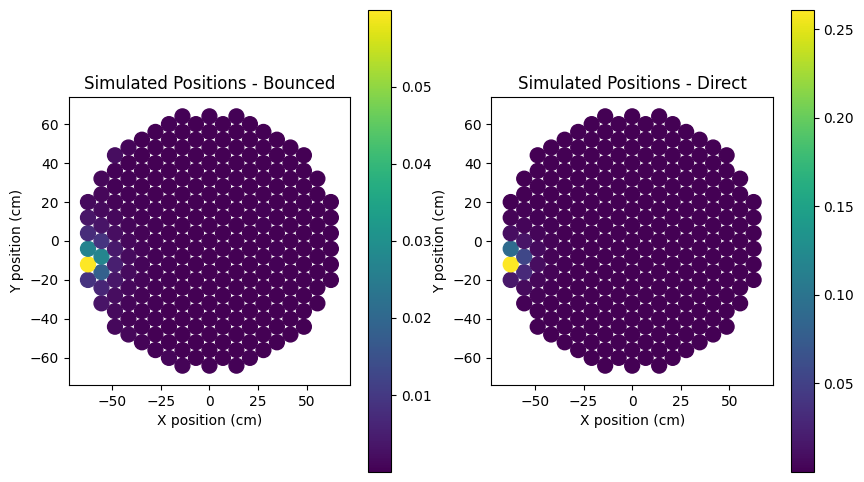

In [35]:
pos_idx = 0

fig, ax = plt.subplots(1,2, figsize=(10,6))
pmt_response = get_pmt_photon_count(pos[pos_idx:pos_idx+1,bounced[pos_idx,:],:], cylinder_max_height, pmt_pos, pmt_radius)
pmt_response /= len(bounced[pos_idx])
plot_pmt_response(pmt_pos=pmt_pos/10, response= pmt_response[0], ax=ax[0],title="Simulated Positions - Bounced", mark_spot=original_pos.reshape(3))
pos_idx = 0
pmt_response = get_pmt_photon_count(pos[pos_idx:pos_idx+1,~bounced[pos_idx,:],:], cylinder_max_height, pmt_pos, pmt_radius)
pmt_response /= len(bounced[pos_idx])
plot_pmt_response(pmt_pos=pmt_pos/10, response= pmt_response[0], ax=ax[1],title="Simulated Positions - Direct", mark_spot=original_pos.reshape(3))

x_min, y_min, z_min: -663.9901 -663.88727 0.0
x_max, y_max, z_max: 663.8136 663.9469 72.0


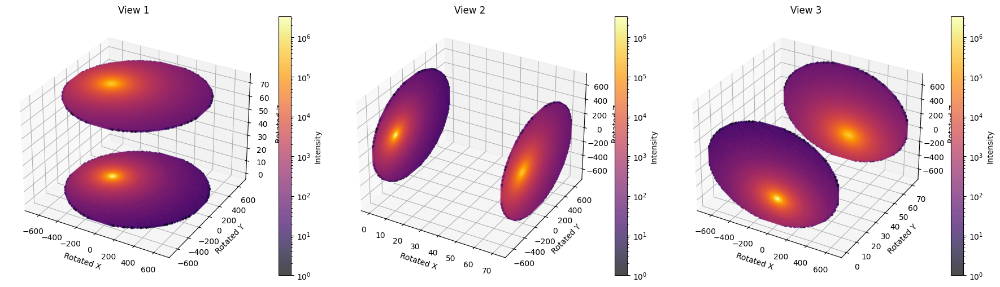

In [15]:
_ = create_3d_fog_map_3view(pos.reshape(-1,3), ~within_Cylinder.reshape(-1), bin_count=100, norm=LogNorm, rotation_matrices=None)

### Load Things

In [618]:
# Utilix broken in this version tag -> Cancel cell after 2s then start again
import os
os.environ["XENON_CONFIG"] = '/Code/xenon.config'
import straxen

[autoreload of functions failed: Traceback (most recent call last):
  File "/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 500, in superreload
    update_generic(old_obj, new_obj)
  File "/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 397, in update_generic
    update(a, b)
  File "/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 365, in update_class
    update_instances(old, new)
  File "/opt/XENONnT/anaconda/envs/XENONnT_el9.2024.10.4/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 319, in update_instances
    refs = gc.get_referrers(old)
KeyboardInterrupt
]


In [694]:
# imports
import sys
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import tensorflow
import scipy
import keras
import time
from IPython.display import clear_output
from functools import partial
import h5py
#import gc
#from numba import cuda 

import subprocess


# import functions
sys.path.append(os.path.join(os.getcwd(), 'ActualThesisWork'))
%load_ext autoreload
%autoreload 2
from functions import *


tensorflow.config.optimizer.set_jit(False)
# The below is neat when on but it prints over 1000 msg/s 
tensorflow.debugging.set_log_device_placement(False) 
#tensorflow.config.set_visible_devices([], 'GPU') # Because It keeps running out of memory and doesnt remove the data

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [548]:
# Get Data
def get_filtered(path):
    with h5py.File(path, 'r') as f:
        patterns = f['patterns'][:]
        ei = f['event_info'][:]
        # run_ids = f["run_ids"][:]
        print("Total Livetime {}s".format(f.attrs["Livetime_tot_s"]))
        print("Total Datapoints pre filter {}".format(f.attrs["OriginalSize"]))
        print("Total Datapoints post filter {}".format(f.attrs["CurrentSize"]))
    assert len(patterns) == len(ei)
    return patterns, ei
Kr = False
do_flow = False

pmt_pos = straxen.pmt_positions()
pmt_diam = straxen.tpc_pmt_radius
pmt_pos_top = pmt_pos[pmt_pos.array == "top"].to_numpy()
n_pmts = pmt_pos_top.shape[0]
if Kr:
    filtered_path = '/Code/processed_data/Krypton/SrCut_z20_0000.hdf5'

    patterns, ei = get_filtered(filtered_path)
    # Temporary filter
    bool_map_datafilter = (((ei["s2_x_cnn"] - ei["s2_x_gcn"])**2 + (ei["s2_y_cnn"] - ei["s2_y_gcn"])**2)**(1/2) < pmt_diam)
    bool_map_datafilter &= (((ei["s2_x_cnn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_mlp"] - ei["s2_y_mlp"])**2)**(1/2) < pmt_diam)
    bool_map_datafilter &= (((ei["s2_x_gcn"] - ei["s2_x_mlp"])**2 + (ei["s2_y_gcn"] - ei["s2_y_mlp"])**2)**(1/2) < pmt_diam)
    patterns, ei = patterns[bool_map_datafilter], ei[bool_map_datafilter]

    # Grab Relevant Data - We use all models data
    patterns = patterns['s2_area_per_channel'][:, :n_pmts]
else:
    # Load the entire filtered dataset 3.5 mil points
    all_data_df = pd.read_pickle('/Code/processed_data/all_data_min_filter.pkl.gz', compression='gzip')
    patterns = all_data_df.loc[:,'s2_area_per_channel']
    patterns = np.vstack(patterns.to_numpy())
    ei = all_data_df.loc[:, all_data_df.columns != 's2_area_per_channel']


# Grab Relevant Data - We use all models data
# To get tripplet set
#patterns = np.concatenate([patterns,patterns,patterns])
#positions = np.stack([np.concatenate([ei[i] for i in ('s2_x_cnn', 's2_x_gcn', 's2_x_mlp')]), np.concatenate([ei[i] for i in ('s2_y_cnn', 's2_y_gcn', 's2_y_mlp')])],axis = -1)
#positions = np.stack([ei['s2_x'], ei['s2_y']],axis = -1)
# Can also do flow model based
fname = '/Code/posrec_models_from_straxen/flow_20240730.tar.gz'
import tarfile 
def open_jax_model(model_path: str, **kwargs):
    # Copied directly from straxen including the two functions below (modified where required)
    # Nested import to reduce loading time of import straxen as it's not
    # a base requirement
    from jax import export

    # Check if the model file exists
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"No file at {model_path}")
    # Extract required parameters from kwargs
    n_poly = kwargs["n_poly"]
    sig = kwargs["sig"]

    # Open the tar file and extract the requested model
    with tarfile.open(model_path, "r") as f:
        names = f.getnames()

        # Construct the filename based on n_poly and sig
        filename = f"{int(n_poly):02d}_{float(sig) * 1000:3.0f}"

        # Check if the requested model exists in the tar file
        if filename not in names:
            raise ValueError("Requested model not in tarfile!")

        # Extract and read the serialized JAX object
        file_obj = f.extractfile(filename)
        assert file_obj is not None
        serialized_jax_object = file_obj.read()
    # Deserialize the JAX object and return its callable function
    return export.deserialize(serialized_jax_object).call
def vectorized_prediction_chunk(patterns, pred_function, N_chunk_max):
    N_entries = patterns.shape[0]
    if N_entries > N_chunk_max:
        raise ValueError("Chunk greater than max size")
    else:
        inputs = np.zeros((N_chunk_max, pmt_pos_top.shape[0]+1))
        inputs[:N_entries] = patterns
        xy, contour = pred_function(inputs)
        return xy[:N_entries], contour[:N_entries]
def prediction_loop(patterns, pred_function, N_chunk_max=4096):
    N_entries = patterns.shape[0]
    # If the number of entries is within the chunk limit, process in one step
    if N_entries <= N_chunk_max:
        xy, _ = vectorized_prediction_chunk(patterns, pred_function, N_chunk_max)
        return [xy]  # Return as a single-element list for consistency
    N_chunks = N_entries // N_chunk_max
    xy_list = []
    # Process chunks
    for i in range(N_chunks):
        xy, _ = vectorized_prediction_chunk(
            patterns[i * N_chunk_max : (i + 1) * N_chunk_max], pred_function, N_chunk_max
        )
        xy_list.append(xy)

    # Process remaining entries, if any
    if N_chunks * N_chunk_max < N_entries:
        xy, _ = vectorized_prediction_chunk(
            patterns[N_chunks * N_chunk_max :], pred_function, N_chunk_max
        )
        xy_list.append(xy)
    return np.concatenate(xy_list, axis=0)

flow_model = open_jax_model(fname, n_poly=32, sig=0.393)
log_area_scale = 10
# Prep data
with np.errstate(divide="ignore", invalid="ignore"):
    total_top_areas = patterns.sum(axis=1, keepdims=True)
    area_per_channel_top = patterns
    flow_data = np.concatenate(
        [
            area_per_channel_top / total_top_areas,  # Normalize areas per channel
            np.log(total_top_areas) / log_area_scale,  # Log-scale transformation
        ],
        axis=1,
    )
if do_flow:
    positions = prediction_loop(flow_data, flow_model)
else:
    positions = np.array(ei['position'].to_list())

In [4]:
# Get Remaining Global variables
dead_pmts =     np.argwhere(tensorflow.math.reduce_mean(patterns,axis=0) == 0).reshape(-1)
not_dead_pmts = np.argwhere(tensorflow.math.reduce_mean(patterns,axis=0) != 0).reshape(-1)
# Get val train split
n_datapoints = ei.shape[0]
np.random.seed(1111)
shuffle_i = np.arange(n_datapoints)
np.random.shuffle(shuffle_i)
train_end = int(n_datapoints * 0.8)
train_slice = shuffle_i[0:train_end]
val_slice = shuffle_i[train_end:]

pmt_radius = straxen.tpc_pmt_radius# 3  * 2.54 / 2 
tpc_radius = 66.4 # pm 0.2 -> https://xe1t-wiki.lngs.infn.it/doku.php?id=xenon:xenonnt:analysis:coordinate_system&s[]=perpendicular&s[]=wire&s[]=coordinates
max_z = straxen.tpc_z

allow_njit = True
keras_loss = logl_loss_generator(pmt_pos_top, keras.backend, not_dead_pmts = not_dead_pmts, cap=float('inf'), allow_njit=allow_njit)

# Compile the function
if allow_njit:
    keras_loss(np.random.random((1, n_pmts)),np.random.random((1, n_pmts)))

In [695]:
# get rLCE
# Load rLCE
from tensorflow import keras
import tensorflow as tf
class FilterAlive(keras.layers.Layer):
    def __init__(self, alive_pmt_indices, **kwargs):
        super().__init__(**kwargs)
        self.alive = alive_pmt_indices
    
    def call(self, X):
        return tf.gather(X, self.alive, axis = -1)
    
    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.alive.shape)
    
# Taken from Shenyang and slightly modified
import math
class Likelihood(tf.keras.layers.Layer):
    def __init__(self, n_pmts, **kwargs):
        super().__init__(**kwargs)
        self.n_pmts = n_pmts

    def build(self, input_shape):
        self.sigma = self.add_weight(
            shape=(self.n_pmts, ), dtype=tf.float32, name='sigma',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        self.power = self.add_weight(
            shape=(self.n_pmts, ), dtype=tf.float32, name='power',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        super().build(input_shape)

    def call(self, inputs):
        
        cex, cob = inputs[0], inputs[1]
        c = tf.reduce_sum(cob, axis=-1)
        c = tf.reshape(c, (-1, 1))
        cex = cex * c # aex/aob is [events*pmtsize tensor]
        # Deal with numerical instability during training
        cex, cob = tf.clip_by_value(cex, 1e-10, 1e10), tf.clip_by_value(cob, 1e-10, 1e10)
        broaden = 1.2
        cons= 0.1
        y = - (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        - 0.5 * tf.math.log(2 * math.pi * ( broaden * cex + (0.1 * self.sigma * cex**self.power) **2 + cons)))
        
        chi2 = - 2 * (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        )
        # FIXME: Added when trying to find why so much nan - 2e18th of max of float32 - such that no overflow can occur
        #y = tf.where(tf.math.is_nan(y), tf.fill(tf.shape(y), 1.7014117331926443e+20 ), y)
        #chi2 = tf.where(tf.math.is_nan(chi2), tf.fill(tf.shape(y), 1.7014117331926443e+20 ), chi2)
        return tf.reduce_sum(y/ self.n_pmts, axis=1), tf.reduce_sum(chi2/ self.n_pmts, axis=1)#, 2*keras.backend.sum(cob*tensorflow.math.log(cob/cex) - (cob - cex), axis=1) / self.n_pmts

def _logl_loss(patterns, likelihood):
    return likelihood[0]
import sys
sys.path.append(os.path.join(os.getcwd(), 'ActualThesisWork'))
%load_ext autoreload
%autoreload 2
from functions import *

with tf.keras.utils.custom_object_scope({'_logl_loss': _logl_loss}):
    model = tf.keras.models.load_model("/Code/LCE_SR1/LCE_Neural_SR1")
model_chi2 = tf.keras.Model(
            model.inputs, model.get_layer("Likelihood").output
        )
loss_weights = model_chi2.get_layer('Likelihood').get_weights()

model_pattern = tf.keras.Model(model.inputs[0],
                                model.get_layer('normalization_1').output)


pmt_positions = pmt_pos_top[:,-2:]
i0s = np.array([4.3321685e-03, 4.8899297e-03, 4.8685744e-03, 5.0057671e-03, 5.0926125e-03, 3.8192207e-03, 5.0742184e-03, 4.5723971e-03, 4.4081882e-03, 4.2195930e-03, 3.8486260e-03, 4.1838391e-03, 4.0647872e-03, 4.7091218e-03, 5.0830012e-03, 3.3815645e-03, 4.4174474e-03, 4.2217500e-03, 3.8883914e-03, 4.1160719e-03, 4.2805159e-03, 3.8807073e-03, 4.0655909e-03, 4.1060778e-03, 4.1315975e-03, 4.7936141e-03, 3.2942444e-03, 4.9037142e-03, 7.7721901e-10, 3.8406078e-03, 4.3384172e-03, 4.0945616e-03, 4.1323849e-03, 3.5376074e-03, 4.1092960e-03, 4.0294765e-03, 4.2530410e-03, 4.3881517e-03, 4.3557761e-03, 5.2265157e-03, 4.7099791e-03, 4.0602549e-03, 3.7400448e-03, 3.7515005e-03, 4.2108428e-03, 3.9731641e-03, 3.8805525e-03, 4.0709740e-03, 4.3926593e-03, 3.8181171e-03, 4.2493315e-03, 4.1600037e-03, 4.4732001e-03, 5.6759203e-03, 5.1910682e-03, 4.2152693e-03, 3.8856652e-03, 3.9358442e-03, 3.9593815e-03, 4.5243143e-03, 3.3824742e-03, 4.2228648e-03, 4.1722674e-03, 4.0427274e-03, 4.0417486e-03, 3.9301920e-03, 3.6303743e-03, 4.8567164e-03, 4.6816585e-03, 4.6605649e-03, 4.1111340e-03, 3.9693397e-03, 3.9644395e-03, 3.6394752e-03, 4.1905139e-03, 3.8725468e-03, 4.0893927e-03, 4.0443619e-03, 3.8839907e-03, 4.1380730e-03, 3.7537001e-03, 3.9355555e-03, 3.7318014e-03, 3.8118435e-03, 5.2085049e-03, 4.2290958e-03, 4.0234900e-03, 3.5676390e-03, 3.9484301e-03, 4.2167031e-03, 4.2368169e-03, 4.1302987e-03, 4.2008958e-03, 4.2801257e-03, 4.1032447e-03, 4.4811480e-03, 4.2696339e-03, 3.6081157e-03, 4.0258458e-03, 3.9694263e-03, 4.5943419e-03, 4.1785482e-03, 4.4084764e-03, 3.7471219e-03, 4.4116797e-03, 4.0504644e-03, 4.1418886e-03, 4.0030433e-03, 1.0424008e-09, 4.2052269e-03, 4.2578629e-03, 4.5622797e-03, 4.0193330e-03, 4.1911956e-03, 4.2375987e-03, 4.2547933e-03, 3.5730435e-03, 4.5289211e-03, 4.9987421e-03, 4.0041506e-03, 3.9206431e-03, 8.3443069e-10, 4.0859459e-03, 4.0822630e-03, 4.1334494e-03, 4.3958416e-03, 4.0311846e-03, 4.0570530e-03, 4.8540146e-03, 4.1181887e-03, 4.2905537e-03, 3.9505828e-03, 4.1115014e-03, 4.2378809e-03, 5.4844008e-03, 5.1576579e-03, 4.2841639e-03, 4.0341225e-03, 3.7783773e-03, 4.0266900e-03, 4.2498759e-03, 4.2951452e-03, 4.3143658e-03, 4.1313837e-03, 2.1348676e-09, 4.1051428e-03, 4.2898878e-03, 4.2597717e-03, 3.8951659e-03, 4.0271045e-03, 4.2793071e-03, 4.0357350e-03, 3.9217505e-03, 3.9514182e-03, 4.1377540e-03, 3.9742026e-03, 1.2402929e-09, 3.9072270e-03, 4.0098960e-03, 4.4543701e-03, 4.4421032e-03, 4.2735850e-03, 4.3578045e-03, 3.8933735e-03, 6.5661332e-10, 4.0731006e-03, 4.1153133e-03, 3.7559553e-03, 5.4024002e-03, 4.3515279e-03, 3.6778662e-03, 4.5253038e-03, 4.1828337e-03, 4.0867706e-03, 4.4803121e-03, 4.2735278e-03, 4.0277829e-03, 3.0061767e-10, 4.3173237e-03, 3.6315513e-03, 3.7630824e-03, 3.9289133e-03, 3.7644394e-03, 4.8030056e-03, 4.8184181e-03, 3.8601037e-03, 4.0834383e-03, 3.8238778e-03, 3.9222855e-03, 4.1271560e-03, 4.2299703e-03, 4.2282301e-03, 4.2152260e-03, 4.2188424e-03, 4.2601079e-03, 4.1266191e-03, 3.9463951e-03, 4.1020829e-03, 5.2572191e-03, 5.6053256e-03, 4.0953509e-03, 4.2140838e-03, 4.0869401e-03, 4.3971362e-03, 3.9943284e-03, 3.9221593e-03, 4.0147733e-03, 3.9175176e-03, 4.2255772e-03, 3.2839905e-03, 3.5796922e-03, 4.3001343e-03, 5.2305199e-03, 5.2561881e-03, 4.1396990e-03, 3.9065215e-03, 4.0462790e-03, 4.4015646e-03, 3.9156144e-03, 4.1807001e-03, 3.7336536e-03, 2.8916472e-03, 4.3796739e-03, 3.7167547e-03, 3.8832054e-03, 4.9040765e-03, 4.0531182e-03, 4.4816649e-03, 4.2975284e-03, 4.2031519e-03, 3.7932515e-03, 3.6113819e-03, 4.0321909e-03, 4.0693702e-03, 3.8203422e-03, 4.2403601e-03, 4.1839005e-03, 4.4256304e-03, 4.6902383e-03, 4.6948199e-03, 4.1613793e-03, 4.3950700e-03, 4.9116057e-03, 4.2219968e-03, 4.4758134e-03, 4.3810243e-03, 5.3808806e-03, 4.1074217e-03, 4.7744270e-03, 5.3171408e-03, 5.0322791e-03, 4.8009814e-03, 4.0162178e-03])[not_dead_pmts]
rLCE_params = [1.6266745e+00,  9.4918861e+00, -4.2176653e-05,  7.7804564e-03,]

n_alive_pmts = n_pmts - len(dead_pmts)
# Model modified for Radial LCE
input_x = tf.keras.layers.Input(shape=(2,), name='xx', dtype=tf.float32)
x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
rho = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts]), name='Event_Distance')(x)
#WallDist = GetWallDist((n_alive_pmts, 1),tpc_radius,name="WallDist")(x)
x = RadialLCELayer(guess=rLCE_params, n_groups=1, group_slices=np.arange(n_alive_pmts).reshape(1,-1),name='radial_LCE')((rho))
x = I0Layer(n_alive_pmts, name='i0')(x)
x = NormalizationLayer(name='normalization')(x)
# We pass the full array
input_y = tf.keras.layers.Input(shape=(n_pmts,), name='yy', dtype=tf.float32)
y_mod = FilterAlive(not_dead_pmts, name='aliveFilter')(input_y)
y, chi2 = Likelihood(n_alive_pmts, name='Likelihood')([x, y_mod])
radial_mc = tf.keras.models.Model(inputs=[input_x, input_y],
                                    outputs=[y, chi2], name='Radial_mc')

radial_mc.get_layer('i0').set_weights([i0s]) 
radial_mc.get_layer('i0').trainable = False
# No trainable Params but recongized as for some reason
radial_mc.get_layer('Event_Distance').trainable = False
#radial_mc.get_layer('WallDist').trainable = False
radial_mc.get_layer('radial_LCE').trainable = True
radial_mc.get_layer('Likelihood').trainable = False
radial_mc.get_layer('Likelihood').set_weights(loss_weights)
radial_mc.summary()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Model: "Radial_mc"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xx (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 repeat_vector (RepeatVecto  (None, 246, 2)               0         ['xx[0][0]']                  
 r)                                                                                               
                                                                                                  
 Event_Distance (GetRadius)  (None, 246)                  492       ['repeat_vector[0][0]']       
                                                                                                  
 r

In [ ]:
def anode_wires(x, op, which):
    # op = +-
    return op(np.sqrt(3)*x*10, 318 if which == 0 else 283) /10

plus = lambda x, y: x+y
minus = lambda x, y: x-y

x= np.linspace(-66.4,66.4,1000)

y = anode_wires(x, plus, 0)


In [6]:
# Def pattern model
radial_patterns = tf.keras.Model(radial_mc.inputs[0],
                    radial_mc.get_layer('normalization').output ) 
radial_patterns.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xx (InputLayer)             [(None, 2)]               0         
                                                                 
 repeat_vector (RepeatVecto  (None, 246, 2)            0         
 r)                                                              
                                                                 
 Event_Distance (GetRadius)  (None, 246)               492       
                                                                 
 radial_LCE (RadialLCELayer  (None, 246)               4         
 )                                                               
                                                                 
 i0 (I0Layer)                (None, 246)               246       
                                                                 
 normalization (Normalizati  (None, 246)               0   

### Implement Anode Shadow

In [420]:
from dataclasses import dataclass

@dataclass
class AnodeShadowConstants:
    H = 68.58 / 10 # cm
    r = 0.216 / 2 # cm 
    pmt_area = np.pi * pmt_radius**2

def roate_coordinate_system(x, y, angle=30):
    """
    Returns system such that the parallel wires (supporting) are parallel to the y axis
    And the anode mesh is parallel to the x-axis
    """
    angle = np.radians(angle)  # Convert angle to radians
    rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
    return np.dot(rotation_matrix, np.vstack((x, y))) 

def get_closest_anode_x(event_positions,anode_positions):
    """
    Get closest anode positions
    """
    diff = event_positions[:,np.newaxis] - anode_positions
    return anode_positions[np.argmin(np.abs(diff), axis=1)]

def compute_PMT_Plane_projection(x, h, x0, anode_constants):
    """
    x -> The rotated x/y position for the wires in question should be 1d array (ie x or y)
    h -> The distance between anode wire center and S2 event plane
    x0 -> The anode wire position in question (scalar allthough vector might work as well)
    pmt_pos -> Vector of PMT Positions again only 1 of the coordinates in the rotated plane
    anode_constants -> Dataclass containing the relevant constants
    returns
    x1, x2 -> The 2 shadow boundary projections
    """
    theta = np.arctan(h/(x0-x))
    # Need to find the length of the line from event pos to center of anode, to find the hypotenuse of event to anode triangle
    beta = np.sqrt(h**2+(x-x0)**2)
    alpha = np.sqrt(beta**2+anode_constants.r**2) 
    phi = np.arcsin(anode_constants.r/alpha)
    x1 = x + 1/(np.tan(theta-phi)) * x *(anode_constants.H + h)
    x2 = x + 1/(np.tan(theta+phi)) * x *(anode_constants.H + h)
    return x1, x2 # Same shape as x 

def compute_coverage(x1, x2, pmt_pos, anode_constants):
    """
    We compute shadowing and then coverage for each point -> xi is shape n_points
    
    Outputs n_points, m_pmts
    Values are scaled 0-> 1 
    """
    r2 = anode_constants.r**2
    def ar(x):
        """
        Computes right area coverage for x1 and x2

        Outputs n_points, m_pmts
        """
        # Extra angel subtended
        alpha = np.arctan((x[:, np.newaxis] - pmt_pos)/anode_constants.r)
        # If pmt is to the right of x is null
        ret_val = np.zeros_like(alpha)
        #If  pmt is to the left of x-r is area of pmt
        ret_val[x[:, np.newaxis] < (pmt_pos - anode_constants.r)] = np.pi * r2
        # If is inside area is theta * r^2 where theta = pi/2 +- angle extended
        bool_array =(x[:, np.newaxis] > (pmt_pos - anode_constants.r)) & (x[:, np.newaxis] < (pmt_pos + anode_constants.r))
        ret_val[bool_array] = ((np.pi/2 + 2*alpha ) *r2 )[bool_array] # TODO Is there some way to only compute the subset efficiently?
        return ret_val
    return (ar(x1) - ar(x2))/anode_constants.pmt_area # Returns for each x, m pmts scaling parameters

def compute_event_pmt_distance(x, pmt_pos, h, anode_constants):
    """
    Compute 3d euclidean distanace
    Rotated or not frame doesnt matter
    """
    # shape 2, n , assume constant z -> Out n, m
    return (((x[:,:,np.newaxis] - pmt_pos[:,np.newaxis,:])**2).sum(axis=0) + (h+anode_constants.H)**2)**(1/2)


def modify_LCE(LCE, coverage, distance,opacity, decay_constant):
    """Computes the modified LCE
    
    LCE -> n,m
    coverage -> n,m
    distance -> n,m
    opacity -> 1
    decay_const -> 1
    
    """
    return LCE * (1- coverage * opacity * np.exp(- distance / decay_constant))

def get_anode_mesh_y():
    """
    Anode Mesh wire positions rotated y (rel to above implemented rotation)
    """
    wire_pitch=5.0 / 10 # cm
    num_wires=265
    offset=0.25 # cm
    anode_mesh_pos = []
    for i in range(num_wires):
        # Calculate the x position for each wire
        x = (i - num_wires // 2) * wire_pitch
        x += offset
        anode_mesh_pos.append(x)

    return np.array(anode_mesh_pos)

def get_anode_perp_x():
    """
    Anode Perpendicular wire positions x (rel to above implemented rotation)
    """
    return np.array([-318,-283,283,318])/20 # 10 for cm 2 for symmetry

In [19]:
rot_pos = roate_coordinate_system(positions[:,0], positions[:,1])#.reshape(-1,2)
pmt_pos_comp = roate_coordinate_system(pmt_pos_top[:,2], pmt_pos_top[:,3]).astype('float')
# Lets do for x ie the big perpendicular wires
x= rot_pos[1]
anode_constants =AnodeShadowConstants
# For perpendicular wires
anode_positions = get_anode_mesh_y()

h = 0.027 # cm 
opacity = 0.85
decay_constant = 10 # cm

x0 = get_closest_anode_x(x,anode_positions) # Works correclty output of x-x0 homogeneous in -0.25->0.25
x1, x2 = compute_PMT_Plane_projection(x, h, x0, anode_constants) # 
coverage = compute_coverage(x1, x2, pmt_pos_comp[1], anode_constants)
distance = compute_event_pmt_distance(rot_pos, pmt_pos_comp, h, anode_constants)
mod_patterns = modify_LCE(patterns, coverage, distance,opacity, decay_constant)

<Axes: xlabel='X position (cm)', ylabel='Y position (cm)'>

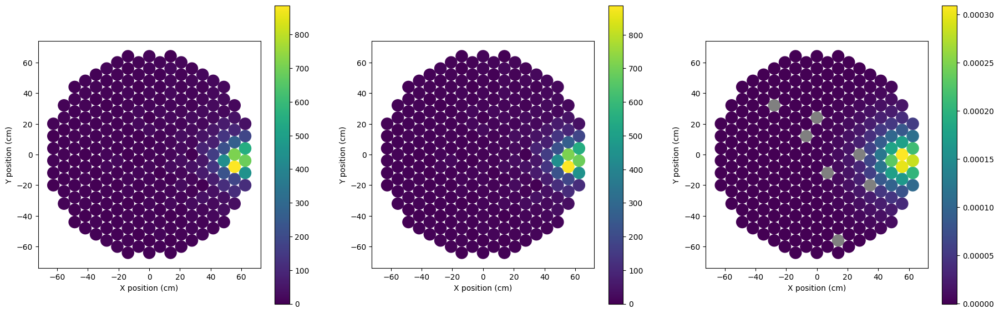

In [20]:

fig,ax = plt.subplots(1,3,figsize=(22,7))
tst =16
plot_pmt_response(pmt_pos_top, mod_patterns[tst], ax[0])
plot_pmt_response(pmt_pos_top, patterns[tst], ax[1])
plot_pmt_response(pmt_pos_top, (patterns[tst]+1e-12)/(mod_patterns[tst]+1e-12)-1, ax[2], dead_pmts=dead_pmts)

1.156873

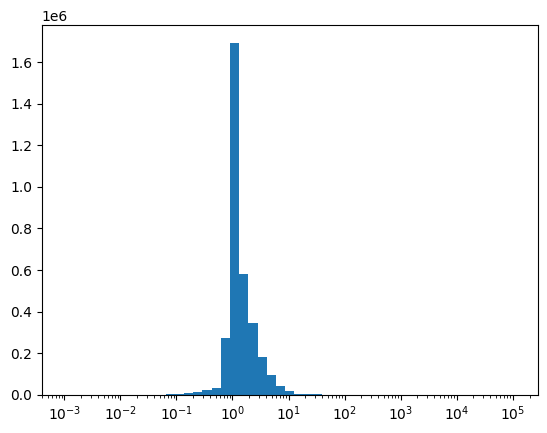

In [22]:
original_loss = radial_mc.predict({'xx':positions, 'yy':patterns})[1]
bins  = np.logspace(-3, np.log10(np.nanmax(original_loss)))
plt.hist(original_loss, bins=bins)
plt.xscale('log')
np.sort(original_loss)[len(original_loss)//2]

103786/103786 [==============================] - 120s 1ms/step


1.15688

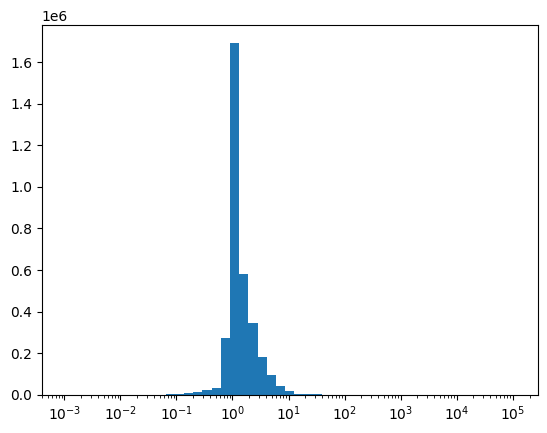

In [23]:
mod_loss = radial_mc.predict({'xx':positions, 'yy':mod_patterns})[1]
bins  = np.logspace(-3, np.log10(np.nanmax(mod_loss)))
plt.hist(mod_loss, bins=bins)
plt.xscale('log')
np.sort(mod_loss)[len(mod_loss)//2]

##### Preemptive Results
Marginally improves loss value, but the parameters do not work

Make a tensorflow layer and inject into model

In [806]:

def check_for_nan(tensor, message="NaN detected!"):
    """
    Checks if a tensor contains NaN values and prints a message if true.
    """
    if tf.reduce_any(tf.math.is_nan(tensor)):
        print(message)

class AdjustLCEAnodeShadow(keras.layers.Layer):
    """
    Computes Radius from input x, y
    """
    def __init__(self,pmt_pos_top,pmt_radius,decay_constant=1.,opacity=0.35, H=68.58 / 10, r=0.216 / 2 , h=0.027, angle=30., anode_mesh=True, n=10, **kwargs):
        super().__init__(**kwargs)

        self.decay_constant = tf.Variable(decay_constant, trainable=True, dtype=tf.float32, name="decay_constant", constraint=tf.keras.constraints.NonNeg())
        self.opacity = tf.Variable(opacity, trainable=True, dtype=tf.float32, name="opacity", constraint=tf.keras.constraints.NonNeg())
        #Always goes Nan -> And im not sure why
        # Something in backpropagation makes it go nan constantly 
        self.h =h#tf.Variable(h, trainable=True, dtype=tf.float32, name="h")


        self.pmt_area = np.pi * pmt_radius**2
        self.r = r
        self.H = H
        self.rotation_matrix = tf.constant([[np.cos(np.deg2rad(angle)), -np.sin(np.deg2rad(angle))], [np.sin(np.deg2rad(angle)), np.cos(np.deg2rad(angle))]],dtype='float32')
        if anode_mesh:
            self.anode_positions = self.get_anode_mesh_y()
        else:
            self.anode_positions = self.get_anode_perp_y()
            
        self.pmt_pos = tf.cast(self.roate_coordinate_system(pmt_pos_top[:,2].astype('float32'), pmt_pos_top[:,3].astype('float32')), dtype=tf.float32)

        # N anodes to compute for
        if n is not None:
            if n== 1:
                self.call_func = self.call_single
            else:
                self.n= n 
                self.call_func = self.call_all
        else: 
            self.call_func = self.call_all
            self.n=len(self.anode_positions)
        return
    
    def build(self, input_shape):
        super().build(input_shape)

    def roate_coordinate_system(self,x, y):
        """
        Returns system such that the parallel wires (supporting) are parallel to the y axis
        And the anode mesh is parallel to the x-axis
        """
        x_stack = tf.stack([x, y], axis=0)
        return tf.matmul(self.rotation_matrix, x_stack)
    
    def get_closest_anode(self,event_positions):
        """
        Get closest anode positions
        """
        diff = event_positions[:, np.newaxis] - self.anode_positions  # Shape (n, m)
        indices = tf.argmin(tf.abs(diff), axis=1)  # Shape (n,)
        return tf.gather(self.anode_positions, indices, axis=0)
    
    def get_n_closest_anodes(self, event_positions):
        """
        Get the n closest anode positions for each event position.
        Args:
            event_positions: A tensor of shape (num_events,).
            n: The number of closest anodes to retrieve.
        Returns:
            A tensor of shape (num_events, n) containing the positions of the n closest anodes.
        """
        # Compute the difference between event positions and anode positions
        diff = event_positions[:, tf.newaxis] - self.anode_positions  # Shape: (num_events, num_anodes)
        abs_diff = tf.abs(diff)  # Shape: (num_events, num_anodes)
        _, top_n_indices = tf.math.top_k(-abs_diff, k=self.n)  # Negative for smallest values; Shape: (num_events, n)
        closest_anodes = tf.gather(self.anode_positions, top_n_indices, axis=0, batch_dims=1)  # Shape: (num_events, n)
        
        return closest_anodes
    
    def get_anode_mesh_y(self,):
        """
        Anode Mesh wire positions rotated y (rel to above implemented rotation)
        """
        wire_pitch=5.0 / 10 # cm
        num_wires=265
        offset=0.25 # cm
        anode_mesh_pos = []
        for i in range(num_wires):
            # Calculate the x position for each wire
            x = (i - num_wires // 2) * wire_pitch
            x += offset
            anode_mesh_pos.append(x)

        return tf.constant(anode_mesh_pos,dtype='float32')
    
    def get_anode_perp_y(self,):
        """
        Anode Perpendicular wire positions rotated y
        """

        return tf.constant([31.8/2, -31.8/2, 28.3/2, -28.3/2],dtype='float32')

    def compute_PMT_Plane_projection(self, x, x0):
        """
        x -> The rotated x/y position for the wires in question should be 1d array (ie x or y)
        h -> The distance between anode wire center and S2 event plane
        x0 -> The anode wire position in question (scalar allthough vector might work as well)
        pmt_pos -> Vector of PMT Positions again only 1 of the coordinates in the rotated plane
        anode_constants -> Dataclass containing the relevant constants
        returns
        x1, x2 -> The 2 shadow boundary projections
        """
        theta = tf.math.atan(self.h/(x0-x))
        theta = tf.clip_by_value(theta, -tf.constant(np.pi/2), tf.constant(np.pi/2))
        alpha = tf.sqrt(h**2+(x-x0)**2+self.r**2) 
        phi = tf.math.asin(self.r/alpha)
        denom1 = 1/(tf.tan(theta-phi))
        denom1 = tf.where(tf.math.is_nan(denom1), tf.zeros_like(denom1), denom1)
        denom2 = 1/(tf.tan(theta+phi))
        denom2 = tf.where(tf.math.is_nan(denom2), tf.zeros_like(denom2), denom2)
        x1 = x + denom1 * x *(self.H + h)
        x2 = x + denom2 * x *(self.H + h)
        return x1, x2 # Same shape as x 
    
    def compute_coverage(self,x1, x2):
        """
        We compute shadowing and then coverage for each point -> xi is shape n_points
        
        Outputs n_points, m_pmts
        Values are scaled 0-> 1 
        """
        r2 = self.r**2
        def ar(x):
            """
            Computes right area coverage for x1 and x2

            Outputs n_points, m_pmts
            """
            # Extra angel subtended
            alpha = tf.math.atan((x[:, np.newaxis] - self.pmt_pos[1,:])/self.r)
            # If pmt is to the right of x is null
            ret_val = tf.zeros_like(alpha)
            #If  pmt is to the left of x-r is area of pmt
            left_condition = x[:, np.newaxis] < (self.pmt_pos[1,:] - self.r)
            ret_val = tf.where(left_condition, tf.constant(np.pi * r2, dtype=tf.float32), ret_val)

            # If inside the area, compute the sector area with the formula (pi/2 + 2 * alpha) * r^2
            inside_condition = (x[:, np.newaxis] > (self.pmt_pos[1,:] - self.r)) & (x[:, np.newaxis] < (self.pmt_pos[1,:] + self.r))

            # Use tf.where for the condition inside the circle and compute the area
            ret_val = tf.where(
                inside_condition,
                (np.pi / 2 + 2 * alpha) * r2,  # Formula for sector area
                ret_val
            )
            return ret_val
        return (ar(x1) - ar(x2))/self.pmt_area # Returns for each x, m pmts scaling parameters

    def compute_event_pmt_distance(self,x):
        """
        Compute 3d euclidean distanace
        Rotated or not frame doesnt matter
        """
        # shape n,2 , assume constant z -> Out n, m
        x_expanded = tf.expand_dims(tf.transpose(x, perm=[1,0]), axis=-1)  # Shape: (n_points,2, 1)
        pmt_pos_expanded = tf.expand_dims(self.pmt_pos, axis=0)  # Shape: (1, 2, m_pmts)
        squared_diff = tf.square(x_expanded - pmt_pos_expanded)  # Shape: (n_points, 2, m_pmts)
        squared_distances = tf.reduce_sum(squared_diff, axis=1)  # Shape: (n_points, m_pmts)
        z_diff_squared = (self.h + self.H)**2
        res = tf.sqrt(squared_distances + z_diff_squared)
        return res
    
    def modify_LCE(self,LCE, coverage, distance):
        """Computes the modified LCE
        
        LCE -> n,m
        coverage -> n,m
        distance -> n,m
        opacity -> 1
        decay_const -> 1
        
        """
        return LCE * (1- coverage * self.opacity * tf.exp(- distance / self.decay_constant))
    
    def LCE_modififier(self, coverage, distance):
        """Computes the LCE Multipler -> For vectorized 
        
        LCE -> n,m
        coverage -> n,m
        distance -> n,m
        opacity -> 1
        decay_const -> 1

        Exponential term
        Ok so we add 6.8 (dist to pmt) as this is the mimimum possible distance, at this when d=0.6 the response is essentially null, 
        so we force d non negative and add 0.8 such that the model can reasonably reach 0.6 ie remainder in decay_const is 0.2

        Coverage:
        For some reason the min is negative lets just force positive 
        Maximum value is O(1e-4) 
        
        For opacity to have any reasonable effect during training we assign a large multiplier 
        
        
        """
        return (1- tf.abs(coverage) * self.opacity *1e4* tf.exp(- (distance / (self.decay_constant+0.8))))#tf.maximum(
 
    @tensorflow.function
    def call_single(self, X, patterns):
        #tf.print(self.decay_constant, self.opacity, self.h)
        # Y coordinate of rated coord system (ie in line wiht mesh)
        #if tf.reduce_any(tf.math.is_nan(X)): print('Nan in input X')
        #if tf.reduce_any(tf.math.is_nan(patterns)): print('Nan in input patterns')
        x = self.roate_coordinate_system(X[:,0], X[:,1])
        #if tf.reduce_any(tf.math.is_nan(x)): print('Nan in rot x')
        x0 = self.get_closest_anode(x[1,:])
        #if tf.reduce_any(tf.math.is_nan(x0)): print('Nan in x0')
        # Shadow Projection on PMT plane
        x1, x2 =self.compute_PMT_Plane_projection(x[1,:], x0)
        #if tf.reduce_any(tf.math.is_nan(x1)): print('Nan in x1')
        #if tf.reduce_any(tf.math.is_nan(x2)): print('Nan in x2')
        # Very susceptible to nan for ill conditioned weights -and 0 gives minimal contribution which should be good
        coverage = self.compute_coverage(x1, x2)
        #if tf.reduce_any(tf.math.is_nan(coverage)): print('Nan in coverage')
        #coverage = tf.where(tf.math.is_nan(coverage), tf.zeros_like(coverage), coverage)
        distance = self.compute_event_pmt_distance(x)
        #if tf.reduce_any(tf.math.is_nan(distance)): print('Nan in distance')
        res = self.modify_LCE(patterns, coverage, distance)
        #if tf.reduce_any(tf.math.is_nan(res)): print('Nan in res')
        #res = tf.where(tf.math.is_nan(res), patterns, res)
        return res
    @tensorflow.function
    def call_all(self, X, patterns):
        """
        Compute for all anode wires
        
        """
        x = self.roate_coordinate_system(X[:,0], X[:,1])
        anodes = self.get_n_closest_anodes(x[1,:])
        # Can be broadcastet by reshaping x 
        x1, x2 =self.compute_PMT_Plane_projection(tf.expand_dims(x[1,:], axis=1), anodes)
        coverage = self.compute_coverage(tf.expand_dims(x1, axis=-1), tf.expand_dims(x2, axis=-1))
        distance = self.compute_event_pmt_distance(x)
        LCE_mods = self.LCE_modififier(coverage, tf.reshape(distance, (-1,1,1,self.pmt_pos.shape[1])))
        #tf.print(tf.reduce_mean(LCE_mods))
        #Multiply out :  (None, 1, 265, 246) squeeze out 1 multiply along 265
        return patterns*tf.reduce_prod(tf.squeeze(LCE_mods,axis=1), axis=1)
    
    def call(self, X,patterns):
        return self.call_func(X,patterns)


    def compute_output_shape(self, input_shape):
        return input_shape[0]
    

class CheckNaNLayer(tf.keras.layers.Layer):
    def __init__(self, message="NaN detected!"):
        super(CheckNaNLayer, self).__init__()
        self.message = message

    def call(self, inputs):
        # Perform the NaN check
        if tf.reduce_any(tf.math.is_nan(inputs)):
            print(self.message)

        return inputs



### And now we inject the layer for the Mesh

TODO Split training data - Use only center of perpendicular wires to train this

In [807]:
input_x = tf.keras.layers.Input(shape=(2,), name='xx', dtype=tf.float32)
x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
rho = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts]), name='Event_Distance')(x)
#WallDist = GetWallDist((n_alive_pmts, 1),tpc_radius,name="WallDist")(x)
x = RadialLCELayer(guess=rLCE_params, n_groups=1, group_slices=np.arange(n_alive_pmts).reshape(1,-1),name='radial_LCE')(rho)
x = I0Layer(n_alive_pmts, name='i0')(x)
x = AdjustLCEAnodeShadow(pmt_pos_top[not_dead_pmts],pmt_radius,name='anode_shadow',
                         decay_constant =1, opacity=1)(input_x, x)

x = NormalizationLayer(name='normalization')(x)
# We pass the full array
input_y = tf.keras.layers.Input(shape=(n_pmts,), name='yy', dtype=tf.float32)
y_mod = FilterAlive(not_dead_pmts, name='aliveFilter')(input_y)
y, chi2 = Likelihood(n_alive_pmts, name='Likelihood')([x, y_mod])
radial_mc_with_anode = tf.keras.models.Model(inputs=[input_x, input_y],
                                    outputs=[y, chi2], name='Radial_mc')

"""
Not all learning rates are reasonable (below as tested by just training the one layer, values do not improve at this level only stable around a slightly worse point)

i0 : 1e-4
radial_LCE : 1e-5
anode_shadow : 

"""


radial_mc_with_anode.get_layer('i0').set_weights([i0s]) 
radial_mc_with_anode.get_layer('i0').trainable              = False
radial_mc_with_anode.get_layer('anode_shadow').trainable    = True
radial_mc_with_anode.get_layer('radial_LCE').trainable      = False
# not to be trained
radial_mc_with_anode.get_layer('Event_Distance').trainable = False
radial_mc_with_anode.get_layer('Likelihood').trainable = False
radial_mc_with_anode.get_layer('Likelihood').set_weights(loss_weights)

def _logl_loss(patterns, likelihood):
    masked_tensor = tf.boolean_mask(likelihood, tf.math.is_finite(likelihood))
    return tf.reduce_mean(masked_tensor)

def _logl_loss(patterns, likelihood):
    return likelihood[1]*10

radial_mc_with_anode.compile(
    loss=_logl_loss,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-2),
    )
radial_mc_with_anode.summary()

Model: "Radial_mc"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xx (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 repeat_vector (RepeatVecto  (None, 246, 2)               0         ['xx[0][0]']                  
 r)                                                                                               
                                                                                                  
 Event_Distance (GetRadius)  (None, 246)                  492       ['repeat_vector[0][0]']       
                                                                                                  
 radial_LCE (RadialLCELayer  (None, 246)                  4         ['Event_Distance[0][0]

In [738]:
# We reduce the dataset - for training
loss = radial_mc.predict({'xx':positions, 'yy':patterns})[1]
dat_reduce = loss < 10

KeyboardInterrupt: 

In [835]:
# Filter between perpendicular wires
def filter_indices_between_perp(positions, dat_reduce):
    # Rotate the coordinate system
    rot_x, rot_y = roate_coordinate_system(positions[:, 0], positions[:, 1], angle=-60)
    # Apply conditions: rot_y within bounds and dat_reduce is True
    condition = (rot_y >= -12) & (rot_y <= 12) & dat_reduce
    # Get indices of items satisfying the condition
    indices = tf.where(condition)[:, 0]  # Extract the indices from the boolean mask
    return indices.numpy()

# Filter close to anode mesh
def filter_indices_near_wires(positions, dat_reduce, num_wires=265, wire_pitch=0.5, offset=0.25):

    # Generate wire positions in the rotated frame
    wire_positions = [(i - num_wires // 2) * wire_pitch + offset for i in range(num_wires)]
    wire_positions = tf.constant(wire_positions, dtype=tf.float16)  # Shape: (num_wires,)

    # Rotate the coordinate system
    rot_x, rot_y = roate_coordinate_system(positions[:, 0], positions[:, 1], angle=-60)
    rot_x = tf.cast(rot_x, tf.float16)
    del rot_y
    # Create condition to check if positions are within 0.1 of any wire position
    condition = tf.zeros_like(rot_x,dtype='bool')
    for i in range(num_wires):
        # Select the current wire position
        wire_pos = wire_positions[i]
        # Check if positions are within the tolerance of this wire
        condition = condition or ((tf.abs(rot_x - wire_pos) <= 0.1) & dat_reduce)
        print("Finished ", i)
    # Get indices of items satisfying the condition
    indices = tf.where(condition)[:, 0]
    return indices.numpy()


#mesh_train_indeces=filter_indices_between_perp(positions, dat_reduce) # ~700,000
mesh_train_indeces=filter_indices_near_wires(positions, dat_reduce, num_wires=265, wire_pitch=0.5, offset=0.25)
np.random.seed(1111)
np.random.shuffle(mesh_train_indeces)

train_end = int(mesh_train_indeces.shape[0] * 0.8)
train_slice = mesh_train_indeces[0:train_end]
val_slice = mesh_train_indeces[train_end:]

: 

: 

In [728]:
x_train = tensorflow.gather(positions, train_slice, axis=0)
y_train = tensorflow.gather(patterns, train_slice, axis=0)
val = ({'xx': tensorflow.gather(positions, val_slice, axis=0), 
        'yy': tensorflow.gather(patterns, val_slice, axis=0)}, 
       tensorflow.gather(patterns, val_slice, axis=0))


In [808]:
from keras.callbacks import TerminateOnNaN 
term = TerminateOnNaN()
early_stopping = tensorflow.keras.callbacks.EarlyStopping(
    monitor='loss',
    patience=6,        
    restore_best_weights=False,
    min_delta=0.01,
    mode='min',    
    verbose=1      
)
reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(
    monitor='loss',
    mode = 'min',
    restore_best_weights=False,
    factor=0.1,           
    patience=2,            
    min_delta=0.015,        
    min_lr=1e-8,           
    verbose=1              
)
radial_mc_with_anode.fit(
    x = {'xx':x_train, 'yy':y_train}, y = y_train, 
    validation_data=val,
    epochs = 100, batch_size = 2**8, 
    callbacks=[term, reduce_lr, early_stopping]
    )

Epoch 1/100
2292/2292 [==============================] - 15s 6ms/step - loss: 50.4637 - Likelihood_loss: 34.6716 - Likelihood_1_loss: 15.7920 - val_loss: 48.6858 - val_Likelihood_loss: 33.9608 - val_Likelihood_1_loss: 14.7250 - lr: 0.0100
Epoch 2/100
2292/2292 [==============================] - 14s 6ms/step - loss: 48.2634 - Likelihood_loss: 33.7492 - Likelihood_1_loss: 14.5141 - val_loss: 48.6737 - val_Likelihood_loss: 33.9516 - val_Likelihood_1_loss: 14.7221 - lr: 0.0100
Epoch 3/100
2292/2292 [==============================] - 14s 6ms/step - loss: 49.9023 - Likelihood_loss: 34.6561 - Likelihood_1_loss: 15.2463 - val_loss: 48.6732 - val_Likelihood_loss: 33.9496 - val_Likelihood_1_loss: 14.7236 - lr: 0.0100
Epoch 4/100
2289/2292 [============================>.] - ETA: 0s - loss: 48.4196 - Likelihood_loss: 33.8255 - Likelihood_1_loss: 14.5940
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
2292/2292 [==============================] - 14s 6ms/step - loss: 48.4

In [679]:
rLCE_params

[1.6266745, 9.4918861, -4.2176653e-05, 0.0077804564]

In [809]:
radial_mc_with_anode.get_layer('anode_shadow').weights

[<tf.Variable 'decay_constant:0' shape=() dtype=float32, numpy=0.001863217>,
 <tf.Variable 'opacity:0' shape=() dtype=float32, numpy=0.023412496>]

In [811]:
loss= radial_mc_with_anode.predict({'xx':positions[mesh_train_indeces], 'yy':patterns[mesh_train_indeces]})[1]

22919/22919 [==============================] - 47s 2ms/step


1.1122214

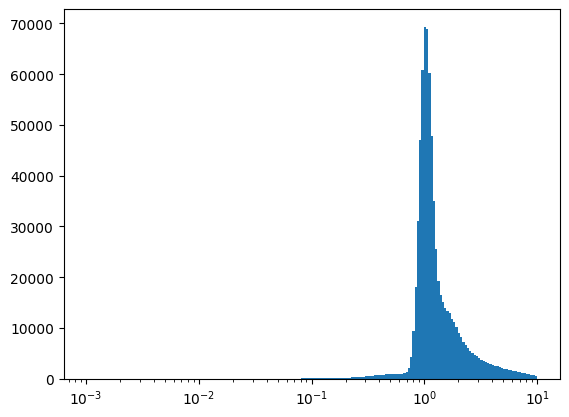

In [812]:
bins = np.logspace(-3,np.log10(np.nanmax(loss)), 200)
plt.hist(loss,bins=bins) #1.112 default implementation, 
plt.xscale('log')
np.sort(loss)[len(loss)//2]


In [ ]:
radial_mc_with_anode_mesh = radial_mc_with_anode.copy()

In [813]:
loss= radial_mc.predict({'xx':positions[mesh_train_indeces], 'yy':patterns[mesh_train_indeces]})[1]

22919/22919 [==============================] - 31s 1ms/step


1.1122167

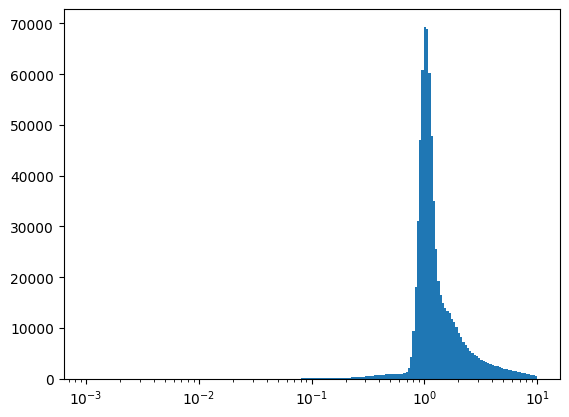

In [814]:
bins = np.logspace(-3,np.log10(np.nanmax(loss)), 200)
plt.hist(loss,bins=bins) #default implementation
plt.xscale('log')
np.sort(loss)[len(loss)//2]


### And the Layer for the perpendicular wires

TODO: Use only area around perpendicular wires to train this

In [427]:
input_x = tf.keras.layers.Input(shape=(2,), name='xx', dtype=tf.float32)
x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
rho = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts]), name='Event_Distance')(x)
#WallDist = GetWallDist((n_alive_pmts, 1),tpc_radius,name="WallDist")(x)
x = RadialLCELayer(guess=rLCE_params, n_groups=1, group_slices=np.arange(n_alive_pmts).reshape(1,-1),name='radial_LCE')(rho)
x = I0Layer(n_alive_pmts, name='i0')(x)
# Mesh - Only use 1 effect of using more is minimal 
x = AdjustLCEAnodeShadow(pmt_pos_top[not_dead_pmts],pmt_radius,name='anode_shadow_mesh', angle=30, n=1)(input_x, x)
# Perpendicular Wires
x = AdjustLCEAnodeShadow(pmt_pos_top[not_dead_pmts],pmt_radius,
                         decay_constant=10.,
                         opacity=0.35, # Leave Opacity the same  
                         H=68.58 / 10, # The distance is approximately the same 
                         r=28.188 / 2 - 31.92 / 2 , # From https://github.com/XENONnT/analysiscode/blob/240f4c1a60ee0c093b3858194339a79f11ecb6d7/PerpendicularWires/PerpendicularWireKrypton.ipynb#L168 
                         h=0.027, # Also assume approximately the same 
                         angle= -60,
                         anode_mesh = False, # Retrieves perp wire coordinates
                         n=None, # Use all anode wires -> Less htan default value here 
                         name='anode_shadow_perp')(input_x, x)



x = NormalizationLayer(name='normalization')(x)
# We pass the full array
input_y = tf.keras.layers.Input(shape=(n_pmts,), name='yy', dtype=tf.float32)
y_mod = FilterAlive(not_dead_pmts, name='aliveFilter')(input_y)
chi2 = Likelihood(n_alive_pmts, name='Likelihood')([x, y_mod]) # If fails because i modified likelihood output y, 
radial_mc_with_anode = tf.keras.models.Model(inputs=[input_x, input_y],
                                    outputs=[chi2], name='Radial_mc')

radial_mc_with_anode.get_layer('i0').set_weights([i0s]) 
radial_mc_with_anode.get_layer('i0').trainable = True
radial_mc_with_anode.get_layer('anode_shadow_mesh').trainable = True
radial_mc_with_anode.get_layer('anode_shadow_perp').trainable = True
radial_mc_with_anode.get_layer('Event_Distance').trainable = False
radial_mc_with_anode.get_layer('radial_LCE').trainable = True
radial_mc_with_anode.get_layer('Likelihood').trainable = False
radial_mc_with_anode.get_layer('Likelihood').set_weights(loss_weights)

def _logl_loss(patterns, likelihood):
    masked_tensor = tf.boolean_mask(likelihood, tf.math.is_finite(likelihood))
    return tf.reduce_mean(masked_tensor)

radial_mc_with_anode.compile(
    loss=_logl_loss,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    )
radial_mc_with_anode.summary()

Model: "Radial_mc"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xx (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 repeat_vector (RepeatVecto  (None, 246, 2)               0         ['xx[0][0]']                  
 r)                                                                                               
                                                                                                  
 Event_Distance (GetRadius)  (None, 246)                  492       ['repeat_vector[0][0]']       
                                                                                                  
 radial_LCE (RadialLCELayer  (None, 246)                  4         ['Event_Distance[0][0]

In [428]:
from keras.callbacks import TerminateOnNaN 
term = TerminateOnNaN()
early_stopping = tensorflow.keras.callbacks.EarlyStopping(
    monitor='loss',
    patience=2,        
    restore_best_weights=False,
    min_delta=0.01,
    mode='min',    
    verbose=1      
)
reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(
    monitor='loss',
    mode = 'min',
    restore_best_weights=False,
    factor=0.25,           
    patience=1,            
    min_delta=0.015,        
    min_lr=1e-8,           
    verbose=1              
)
radial_mc_with_anode.fit(
    x = {'xx':x_train, 'yy':y_train}, y = y_train, 
    validation_data=val,
    epochs = 100, batch_size = 2**8, 
    callbacks=[term, reduce_lr, early_stopping]
    )

Epoch 1/100
10324/10324 [==============================] - 75s 7ms/step - loss: 5.2181 - Likelihood_loss: 3.5701 - Likelihood_1_loss: 1.6480 - val_loss: 5.1654 - val_Likelihood_loss: 3.5521 - val_Likelihood_1_loss: 1.6133 - lr: 1.0000e-05
Epoch 2/100
10324/10324 [==============================] - 70s 7ms/step - loss: 5.1272 - Likelihood_loss: 3.5398 - Likelihood_1_loss: 1.5874 - val_loss: 5.0980 - val_Likelihood_loss: 3.5342 - val_Likelihood_1_loss: 1.5638 - lr: 1.0000e-05
Epoch 3/100
10324/10324 [==============================] - 66s 6ms/step - loss: 5.0718 - Likelihood_loss: 3.5213 - Likelihood_1_loss: 1.5506 - val_loss: 5.0546 - val_Likelihood_loss: 3.5179 - val_Likelihood_1_loss: 1.5367 - lr: 1.0000e-05
Epoch 4/100
10324/10324 [==============================] - 70s 7ms/step - loss: 5.0474 - Likelihood_loss: 3.5130 - Likelihood_1_loss: 1.5344 - val_loss: 5.0428 - val_Likelihood_loss: 3.5132 - val_Likelihood_1_loss: 1.5296 - lr: 1.0000e-05
Epoch 5/100
10323/10324 [===================

In [430]:
radial_mc_with_anode.get_layer('anode_shadow_mesh').weights,radial_mc_with_anode.get_layer('anode_shadow_perp').weights

([<tf.Variable 'decay_constant:0' shape=() dtype=float32, numpy=10.18441>,
  <tf.Variable 'opacity:0' shape=() dtype=float32, numpy=0.4267347>],
 [<tf.Variable 'decay_constant:0' shape=() dtype=float32, numpy=9.631334>,
  <tf.Variable 'opacity:0' shape=() dtype=float32, numpy=-0.022171652>])

In [432]:
loss= radial_mc_with_anode.predict({'xx':positions, 'yy':patterns})[1] #Orig on redued set 1.156 median

103233/103233 [==============================] - 163s 2ms/step


1.1379828

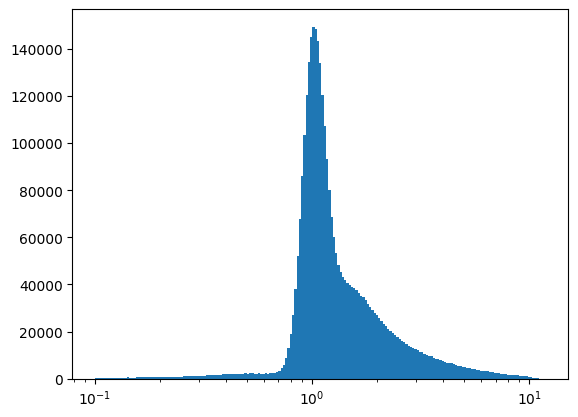

In [442]:
bins = np.logspace(-1,np.log10(np.nanmax(loss)), 200)
plt.hist(loss,bins=bins) #1.02 - 1 grp , 1.01 - n_grps high batch , 1.01 - n_grps low batch 
plt.xscale('log')
np.sort(loss)[len(loss)//2]


### And now finetune on entire dataset minus high loss

In [443]:
radial_pattern = tf.keras.Model(radial_mc_with_anode.inputs[0],
                    radial_mc_with_anode.get_layer('normalization').output ) 

In [444]:
# binned data -> Very slow
def get_top_n_binned_values(data, n, granularity = 1000):
    """
    data - Some pattern to be binned
    n - Number of highest points to return
    granularity - Inverse of bin width -> Note 1e3 is faster than 1e2 as padding is expensive
    """
    # Bin the data 
    binned_data = ((data * granularity) // 1) / granularity 
    # Sort return unique 
    # -> Along second axis does not work for some reason, along first is perfectly fine
    #Along transpose it also does not work 
    # sorted_data = np.unique(binned_data, axis=-1)
    # For some there may not be 5 non zero entries
    padded_result = lambda row, n, pad_value=0: np.pad(np.unique(row)[-n:], (n - min(len(row), n), 0), constant_values=pad_value)
    sorted_data = np.array([padded_result(np.unique(row)[-n:], n) for row in binned_data])
    # Take the top n values
    #return sorted_data[:, -n:]
    return sorted_data[:,::-1]

act_qes = [32.2,30.8,28.6,29.7,29.8,32.2,32.1,31.1,31.1,31.1,31.1,31.1,31.1,31.2,32.2,29.6,30.7,33.9,30.2,29.7,32.2,33.2,32.2,30.0,31.2,30.9,28.8,28.5,32.1,31.0,32.6,32.6,32.6,29.8,32.7,32.8,32.8,31.2,33.6,31.3,29.5,32.1,31.2,32.6,33.1,33.1,30.0,33.2,33.2,28.6,32.5,32.2,34.5,32.2,33.2,30.2,32.1,29.6,33.5,33.6,32.8,33.2,33.6,33.6,33.2,30.6,30.5,31.3,30.0,29.4,32.1,30.9,33.2,33.1,33.6,33.8,34.0,33.8,30.4,33.6,32.5,33.2,29.2,30.9,30.0,32.4,30.8,30.6,31.9,33.1,34.6,33.8,34.0,33.9,34.0,35.2,33.6,29.6,32.3,32.3,32.1,33.0,32.1,29.5,33.1,33.7,33.5,33.8,33.9,34.0,34.1,33.9,30.5,33.7,32.8,33.2,29.0,31.4,32.8,29.7,33.0,32.5,33.1,33.9,33.5,34.0,34.1,34.1,34.0,33.9,33.6,31.4,32.2,32.3,32.8,32.5,30.6,32.0,33.5,32.5,33.7,34.0,33.9,33.8,34.0,33.6,33.0,32.9,32.3,32.3,30.0,29.4,28.4,32.0,33.0,33.0,33.6,33.7,33.4,33.9,33.4,33.6,33.3,32.9,31.4,31.4,30.1,30.6,32.0,32.1,29.3,32.5,33.0,33.4,33.7,33.7,33.7,33.2,33.3,32.9,32.8,32.6,30.1,28.5,29.2,32.8,32.0,29.5,33.0,33.4,33.9,33.4,33.4,33.9,32.9,32.3,30.1,30.1,31.5,32.2,29.3,31.5,32.5,33.0,33.0,32.1,31.5,31.3,32.9,28.6,29.2,31.5,28.6,33.0,30.5,29.4,32.5,32.5,30.4,32.4,32.4,29.9,32.4,31.5,30.2,32.3,31.9,30.5,31.9,31.9,28.6,31.6,31.6,29.1,31.6,30.8,30.2,32.3,30.5,30.5,29.1,31.7,33.8,32.4,29.7,28.6,32.3,30.4,29.0,31.3,29.9,28.6,30.3]
act_qes = np.array(act_qes)[not_dead_pmts]
act_qes /= act_qes.max()
act_qes=act_qes.reshape(1,-1)

grid_size = 800  # Number of points along each dimension


# Step 1: Generate a regular grid of points
x = np.linspace(-tpc_radius, tpc_radius, grid_size)
y = np.linspace(-tpc_radius, tpc_radius, grid_size)
xx, yy = np.meshgrid(x, y)

# Mask points outside the circle
mask = xx**2 + yy**2 <= tpc_radius**2

pos_data = np.column_stack((xx.ravel(), yy.ravel())) 

patterns_rLCE = radial_pattern.predict({'xx': pos_data})/act_qes #/ i0s.reshape(1,-1)
patterns_rLCE /= np.sum(patterns_rLCE, axis=-1).reshape(-1,1)

radial_binned = get_top_n_binned_values(patterns_rLCE, 5)

20000/20000 [==============================] - 23s 1ms/step


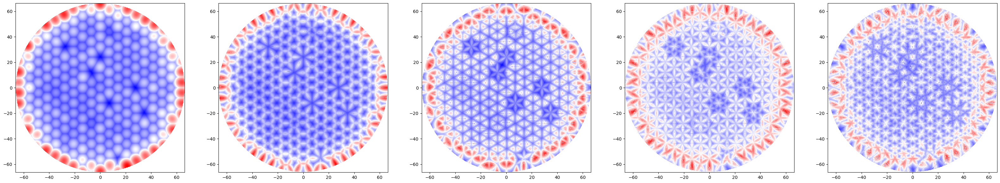

In [445]:
fig, ax = plt.subplots(1,5,figsize=(40,8))
cmap= 'bwr' # tab20 or tab20c to properly see difference
for i in range(5):
    z2 = radial_binned[:, i].reshape(xx.shape)
    z2[~mask] = np.nan


    im1 = ax[i].imshow(
        z2, origin='lower', aspect='equal', cmap=cmap, extent=(x.min(), x.max(), y.min(), y.max())
    )

### Do Encoder

#### New Model

Doing the entire dataset takes about 20 min per epoch

TODO: Select based on center of Perp wires area - This will probably be too sparse

In [452]:
## Construct

n_to_update = len(positions[::100])
input = keras.layers.Input(shape=(1,)) # In 1 index
m = keras.layers.Embedding(n_to_update, 2, input_length = 1, name='embed_pos')(input) # xy out to be optimized
n = keras.layers.Embedding(n_to_update, n_pmts, input_length = 1, name='embed_pattern')(input) # Pattern out 
m = keras.layers.Flatten()(m)
n = keras.layers.Flatten()(n)
m = radial_mc_with_anode({'xx':m, 'yy':n})
pos_updater = keras.models.Model(inputs= input, outputs=m, name="Position_Updater")
pos_updater.layers[-1].trainable = False
pos_updater.get_layer('embed_pos').set_weights([positions[::100]])

pos_updater.get_layer('embed_pattern').set_weights([patterns[::100]])
pos_updater.get_layer('embed_pattern').trainable = False


In [453]:
best_pos = positions[::100].numpy().copy()
best_loss = radial_mc_with_anode.predict({'xx':positions[::100], 'yy':patterns[::100]})[0][1]

1033/1033 [==============================] - 2s 1ms/step


In [457]:
# Iteratively find best pos

for i in range(8):
    pos_updater.compile(loss= _logl_loss, optimizer = keras.optimizers.Adam(learning_rate=2e-2))

    pos_updater.get_layer('embed_pos').set_weights([best_pos+tf.random.normal(shape=positions[::100].shape, mean=0.0, stddev=1.0)])

    term = TerminateOnNaN() #TODO Own terminate on Nan this one just stops but values go to nan so ther is no point
    early_stopping = tensorflow.keras.callbacks.EarlyStopping(
            monitor='loss',
            restore_best_weights=True,
            patience=2,    
            min_delta=0.01,
            mode='min',    
            verbose=1      
        )
    reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(
            monitor='loss', 
            mode = 'min',
            factor=0.25,     
            patience=1,     
            min_delta=0.02, 
            min_lr=1e-4,    
            verbose=1       
        )

    pos_updater.fit(x = np.arange(patterns[::100].shape[0]), y = patterns[::100], 
                        epochs = 2000, batch_size = 2**5,
                        callbacks=[early_stopping,reduce_lr,term], verbose = 1)  
    
    loss = radial_mc_with_anode.predict({'xx':pos_updater.get_layer('embed_pos').get_weights()[0], 'yy':patterns[::100]})[0][1]
    better_at = (loss < best_loss)
    best_pos[better_at] = pos_updater.get_layer('embed_pos').get_weights()[0][better_at]
    best_loss[better_at] = loss[better_at]
    del better_at, loss

Epoch 1/2000
1033/1033 [==============================] - 5s 2ms/step - loss: 6.2363 - Radial_mc_loss: 3.9108 - Radial_mc_1_loss: 2.3254 - lr: 0.0200
Epoch 2/2000
1033/1033 [==============================] - 2s 2ms/step - loss: 5.6938 - Radial_mc_loss: 3.7299 - Radial_mc_1_loss: 1.9639 - lr: 0.0200
Epoch 3/2000
1033/1033 [==============================] - 2s 2ms/step - loss: 5.3203 - Radial_mc_loss: 3.6054 - Radial_mc_1_loss: 1.7149 - lr: 0.0200
Epoch 4/2000
1033/1033 [==============================] - 2s 2ms/step - loss: 5.1529 - Radial_mc_loss: 3.5495 - Radial_mc_1_loss: 1.6033 - lr: 0.0200
Epoch 5/2000
1033/1033 [==============================] - 2s 2ms/step - loss: 5.0904 - Radial_mc_loss: 3.5287 - Radial_mc_1_loss: 1.5617 - lr: 0.0200
Epoch 6/2000
1033/1033 [==============================] - ETA: 0s - loss: 5.0751 - Radial_mc_loss: 3.5236 - Radial_mc_1_loss: 1.5515
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
1033/1033 [==============================]

1.1342945

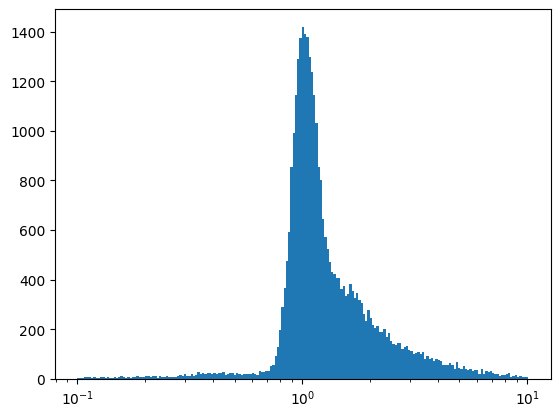

In [462]:
bins=np.logspace(-1,np.log10(np.nanmax(best_loss)),200)
plt.hist(best_loss,bins=bins)
plt.xscale('log')
np.sort(best_loss)[len(best_loss)//2]

#### Base rLCE

In [464]:
## Construct
n_to_update = len(positions[::100])
input = keras.layers.Input(shape=(1,)) # In 1 index
m = keras.layers.Embedding(n_to_update, 2, input_length = 1, name='embed_pos')(input) # xy out to be optimized
n = keras.layers.Embedding(n_to_update, n_pmts, input_length = 1, name='embed_pattern')(input) # Pattern out 
m = keras.layers.Flatten()(m)
n = keras.layers.Flatten()(n)
m = radial_mc({'xx':m, 'yy':n})
pos_updater_base = keras.models.Model(inputs= input, outputs=m, name="Position_Updater")
pos_updater_base.layers[-1].trainable = False
pos_updater_base.get_layer('embed_pos').set_weights([positions[::100]])

pos_updater_base.get_layer('embed_pattern').set_weights([patterns[::100]])
pos_updater_base.get_layer('embed_pattern').trainable = False


In [466]:
best_pos_orig = positions[::100].numpy().copy()
best_loss_orig = radial_mc_with_anode.predict({'xx':positions[::100], 'yy':patterns[::100]})[0][1]

1033/1033 [==============================] - 2s 1ms/step


In [468]:
# Iteratively find best pos

for i in range(8):
    pos_updater_base.compile(loss= _logl_loss, optimizer = keras.optimizers.Adam(learning_rate=2e-2))

    pos_updater_base.get_layer('embed_pos').set_weights([best_pos+tf.random.normal(shape=positions[::100].shape, mean=0.0, stddev=1.0)])

    term = TerminateOnNaN() #TODO Own terminate on Nan this one just stops but values go to nan so ther is no point
    early_stopping = tensorflow.keras.callbacks.EarlyStopping(
            monitor='loss',
            restore_best_weights=True,
            patience=2,    
            min_delta=0.01,
            mode='min',    
            verbose=1      
        )
    reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(
            monitor='loss', 
            mode = 'min',
            factor=0.25,     
            patience=1,     
            min_delta=0.02, 
            min_lr=1e-4,    
            verbose=1       
        )

    pos_updater_base.fit(x = np.arange(patterns[::100].shape[0]), y = patterns[::100], 
                        epochs = 2000, batch_size = 2**5,
                        callbacks=[early_stopping,reduce_lr,term], verbose = 1)  
    
    loss = radial_mc_with_anode.predict({'xx':pos_updater_base.get_layer('embed_pos').get_weights()[0], 'yy':patterns[::100]})[0][1]
    better_at = (loss < best_loss)
    best_pos_orig[better_at] = pos_updater_base.get_layer('embed_pos').get_weights()[0][better_at]
    best_loss_orig[better_at] = loss[better_at]
    del better_at, loss

Epoch 1/2000
1033/1033 [==============================] - 4s 3ms/step - loss: 6.2608 - Radial_mc_loss: 3.9111 - Radial_mc_1_loss: 2.3496 - lr: 0.0200
Epoch 2/2000
1033/1033 [==============================] - 3s 3ms/step - loss: 5.7316 - Radial_mc_loss: 3.7347 - Radial_mc_1_loss: 1.9969 - lr: 0.0200
Epoch 3/2000
1033/1033 [==============================] - 3s 3ms/step - loss: 5.3703 - Radial_mc_loss: 3.6143 - Radial_mc_1_loss: 1.7560 - lr: 0.0200
Epoch 4/2000
1033/1033 [==============================] - 4s 4ms/step - loss: 5.2132 - Radial_mc_loss: 3.5619 - Radial_mc_1_loss: 1.6513 - lr: 0.0200
Epoch 5/2000
1033/1033 [==============================] - 4s 3ms/step - loss: 5.1579 - Radial_mc_loss: 3.5435 - Radial_mc_1_loss: 1.6144 - lr: 0.0200
Epoch 6/2000
1020/1033 [============================>.] - ETA: 0s - loss: 5.1463 - Radial_mc_loss: 3.5393 - Radial_mc_1_loss: 1.6071
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
1033/1033 [==============================]

1.1407541

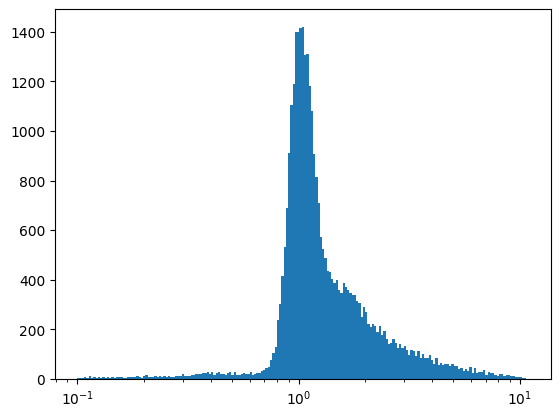

In [471]:
bins=np.logspace(-1,np.log10(np.nanmax(best_loss_orig)),200)
plt.hist(best_loss_orig,bins=bins)
plt.xscale('log')
np.sort(best_loss_orig)[len(best_loss)//2]

#### Now some plotting

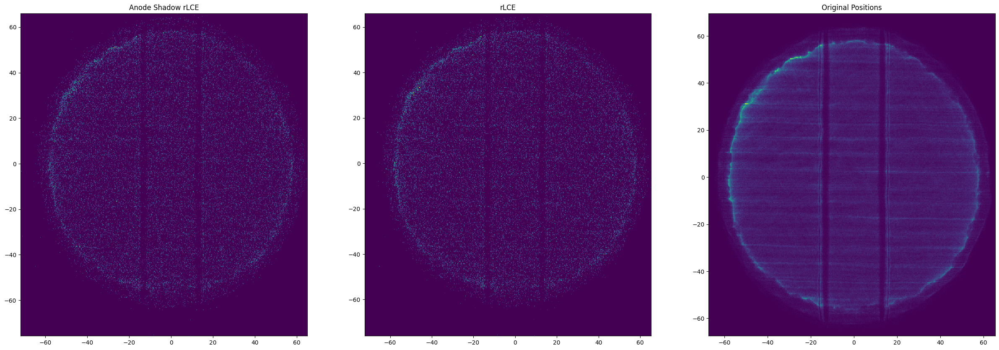

In [472]:
angle = np.radians(30)  # Convert angle to radians
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])

bins = 512

fig,ax = plt.subplots(1,3,figsize=(30,10))
ax[0].hist2d(*np.dot(rotation_matrix, np.vstack((best_pos[:,0], best_pos[:,1]))), bins=bins)
ax[0].set_title('Anode Shadow rLCE')
ax[1].hist2d(*np.dot(rotation_matrix, np.vstack((best_pos_orig[:,0], best_pos_orig[:,1]))), bins=bins)
ax[1].set_title('rLCE')
ax[2].hist2d(*np.dot(rotation_matrix, np.vstack((positions[:,0], positions[:,1]))), bins=bins)
ax[2].set_title('Original Positions')
fig.show()

Text(0, 0.5, 'Frequency Y (cm$^{-1}$)')

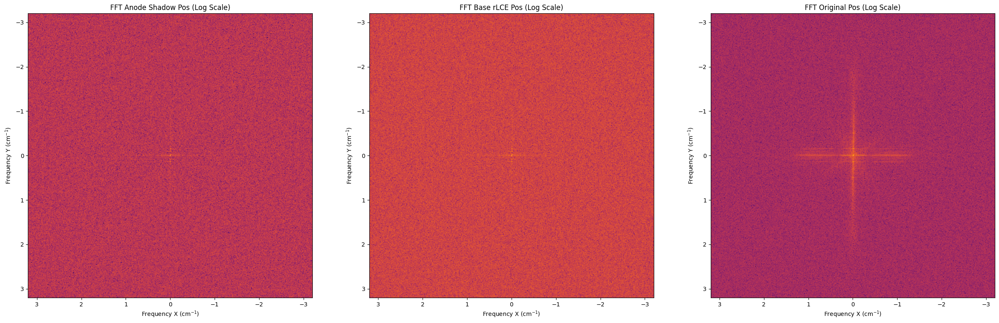

In [473]:
# Try fft we need 2 per cm-1 as max freq 

from scipy.fftpack import fft2, fftshift

def do_fft(x, y):
    angle = np.radians(30)  # Convert angle to radians
    rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
    rotated_positions = np.dot(rotation_matrix, np.vstack((x, y)))  # Apply rotation
    # Extract rotated x and y coordinates
    rotated_x, rotated_y = rotated_positions[0], rotated_positions[1]

    x_range = [-40, 40]
    y_range = [-40, 40]
    grid_size = 512 

    x_spatial_extent = x_range[0] - x_range[1]  
    y_spatial_extent = y_range[0] - y_range[1]  
    x_bin_size = x_spatial_extent / grid_size
    y_bin_size = y_spatial_extent / grid_size
    density, xedges, yedges = np.histogram2d(rotated_x, rotated_y, bins=grid_size, range=[x_range, y_range])
    # Step 3: Perform 2D FFT on the rotated density map
    fft_result = fft2(density.T)
    fft_result = fftshift(fft_result)  # Shift zero frequency to the center for visualization

    f_max_x = 1 / (2 * x_bin_size)  # Max frequency in cm^-1 for x
    f_max_y = 1 / (2 * y_bin_size)  # Max frequency in cm^-1 for y
    return np.abs(fft_result), [-f_max_x, f_max_x, -f_max_y, f_max_y]

fig,ax = plt.subplots(1,3,figsize=(30,10))
fft_result, extent = do_fft(best_pos[:,0], best_pos[:,1])
ax[0].imshow(np.log(fft_result), extent=extent, origin='lower', cmap='inferno')
ax[0].set_title("FFT Anode Shadow Pos (Log Scale)")
ax[0].set_xlabel("Frequency X (cm$^{-1}$)")
ax[0].set_ylabel("Frequency Y (cm$^{-1}$)")


fft_result, extent = do_fft(best_pos_orig[:,0], best_pos_orig[:,1])
ax[1].imshow(np.log(fft_result), extent=extent, origin='lower', cmap='inferno')
ax[1].set_title("FFT Base rLCE Pos (Log Scale)")
ax[1].set_xlabel("Frequency X (cm$^{-1}$)")
ax[1].set_ylabel("Frequency Y (cm$^{-1}$)")

fft_result, extent = do_fft(positions[:,0], positions[:,1])
ax[2].imshow(np.log(fft_result), extent=extent, origin='lower', cmap='inferno')
ax[2].set_title("FFT Original Pos (Log Scale)")
ax[2].set_xlabel("Frequency X (cm$^{-1}$)")
ax[2].set_ylabel("Frequency Y (cm$^{-1}$)")

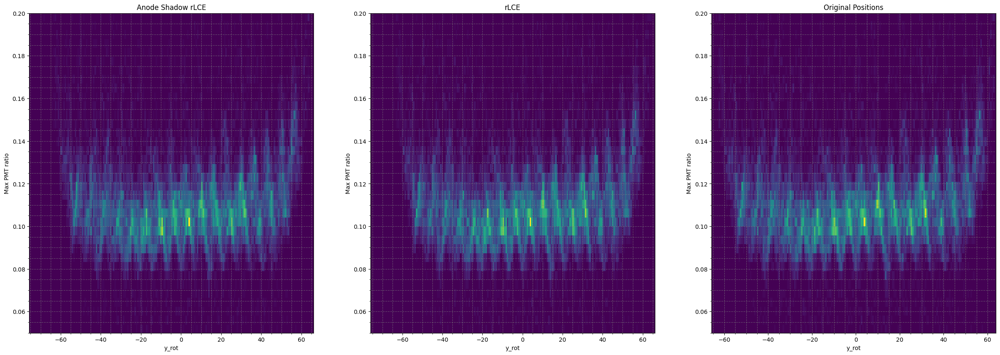

In [478]:
max_pmt_ratio = (patterns[::100].numpy() / patterns[::100].numpy().sum(axis=-1).reshape(-1,1)).max(axis=-1)

fig,ax = plt.subplots(1,3,figsize=(30,10))
x_rot, y_rot = np.dot(rotation_matrix, np.vstack((best_pos[:,0], best_pos[:,1])))
ax[0].hist2d(y_rot, max_pmt_ratio, bins = 200)
ax[0].set_title('Anode Shadow rLCE')
ax[0].set_ylabel("Max PMT ratio")
ax[0].set_xlabel("y_rot")
ax[0].minorticks_on()
ax[0].grid(which='both',alpha=0.6, linestyle='--',c='grey')
x_rot, y_rot = np.dot(rotation_matrix, np.vstack((best_pos_orig[:,0], best_pos_orig[:,1])))
ax[1].hist2d(y_rot, max_pmt_ratio, bins = 200)
ax[1].set_title('rLCE')
ax[1].set_ylabel("Max PMT ratio")
ax[1].set_xlabel("y_rot")
ax[1].minorticks_on()
ax[1].grid(which='both',alpha=0.6, linestyle='--',c='grey')
x_rot, y_rot = np.dot(rotation_matrix, np.vstack((positions[::100][:,0], positions[::100][:,1])))
ax[2].hist2d(y_rot, max_pmt_ratio, bins = 200)
ax[2].set_title('Original Positions')
ax[2].set_ylabel("Max PMT ratio")
ax[2].set_xlabel("y_rot")
ax[2].minorticks_on()
ax[2].grid(which='both',alpha=0.6, linestyle='--',c='grey')

for i in ax:
    i.set_ylim(0.05,0.2)

In [479]:
# Create the subplots
x_rot, y_rot = np.dot(rotation_matrix, np.vstack((best_pos[:, 0], best_pos[:, 1])))
hist_1, xedges, yedges = np.histogram2d(y_rot, max_pmt_ratio, bins=200)
x_rot, y_rot = np.dot(rotation_matrix, np.vstack((best_pos_orig[:, 0], best_pos_orig[:, 1])))
hist_2, xedges, yedges = np.histogram2d(y_rot, max_pmt_ratio, bins=200)
x_rot, y_rot = np.dot(rotation_matrix, np.vstack((positions[:, 0], positions[:, 1])))
hist_3, xedges, yedges = np.histogram2d(y_rot, max_pmt_ratio, bins=200)

hist_1_normalized = hist_1 #/ np.sum(hist_1)
hist_2_normalized = hist_2 #/ np.sum(hist_2)
hist_3_normalized = hist_3 #/ np.sum(hist_3)

diff_1_2 = (hist_1_normalized / hist_2_normalized)
diff_1_2[diff_1_2==1] = float('nan')
diff_1_3 = (hist_1_normalized / hist_3_normalized)
diff_1_3[diff_1_3==1] = float('nan')
diff_2_3 = (hist_2_normalized / hist_3_normalized)
diff_2_3[diff_2_3==1] = float('nan')

extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
from matplotlib.colors import Normalize
norm = Normalize(vmin=.5, 
                 vmax=1.5, 
                 )

plt.figure(figsize=(30, 10))
plt.subplot(1, 3, 1)
plt.imshow(diff_1_2.T, origin='lower', aspect='auto', cmap='seismic', extent=extent,norm=norm)
plt.title("Density Difference (Anode vs rLCE)")
plt.colorbar()
plt.minorticks_on()
plt.grid(which='both',alpha=0.6, linestyle='--',c='grey')
plt.gca().set_facecolor('black')
plt.subplot(1, 3, 2)
plt.imshow(diff_1_3.T, origin='lower', aspect='auto', cmap='seismic', extent=extent,norm=norm)
plt.title("Density Difference (Anode vs Original)")
plt.colorbar()
plt.minorticks_on()
plt.grid(which='both',alpha=0.6, linestyle='--',c='grey')
plt.gca().set_facecolor('black')
plt.subplot(1, 3, 3)
plt.imshow(diff_2_3.T, origin='lower', aspect='auto', cmap='seismic', extent=extent,norm=norm)
plt.title("Density Difference (rLCE vs Original)")
plt.colorbar()
plt.minorticks_on()
plt.grid(which='both',alpha=0.6, linestyle='--',c='grey')
plt.gca().set_facecolor('black')
plt.tight_layout()
plt.show()

ValueError: x and y must have the same length.

### Alternate Wall Terms

In [ ]:
x_rot, y_rot = np.dot(rotation_matrix, np.vstack((best_pos[:, 0], best_pos[:, 1])))
plt.hist2d(pos['s2x'])

### Wall Term investigation

The idea is I look at all the responses that could be problematic

- Wall specifically

- Under and around the anode mesh 

- Under and around the perpendicular wires

And see how these are modified relative to my LCE from the Radial LCE function

I can also compare this to the MC data, and real data.

In [23]:
"""
First steps:
Compute for each PMT a circular grid within its radius a pattern and select its own response

Do this for the outer PMT's first : r of pmt > 60

Plot as PMT response heatmap of Radius from PMT center and distance from wall
"""
bins = 500

x = np.linspace(-1, 1, bins) * tpc_radius
y = np.linspace(-1, 1, bins) * tpc_radius
xx, yy = np.meshgrid(x, y) 

mask = ((xx**2 + yy**2) <= tpc_radius**2)

pmt_sampling_grid = np.column_stack((xx[mask], yy[mask]))

f_pmt_responses_radial = radial_patterns.predict(pmt_sampling_grid)
f_pmt_responses_nn = model_pattern.predict(pmt_sampling_grid)

6110/6110 [==============================] - 89s 15ms/step


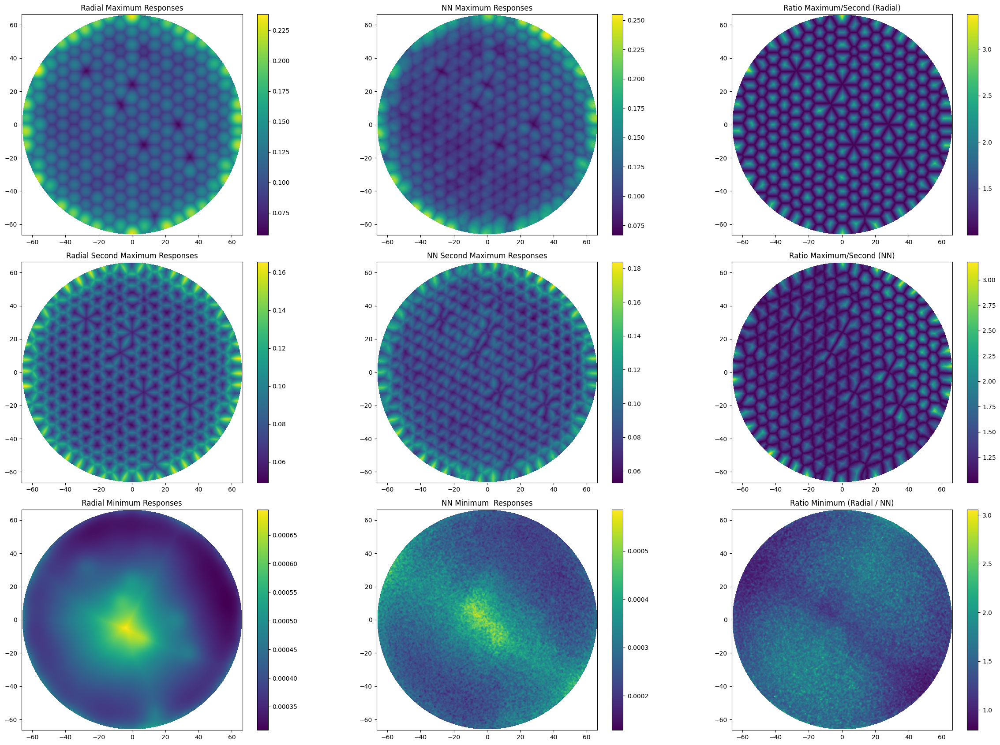

In [95]:

response_radial = np.full(xx.shape, np.nan)  # Initialize with NaN
response_nn = np.full(xx.shape, np.nan)
response_ratio = np.full(xx.shape, np.nan)

response_radial[mask] = np.max(f_pmt_responses_radial,axis=-1)
response_nn[mask] = np.max(f_pmt_responses_nn,axis=-1)
response_ratio = response_radial / response_nn

fig, axes = plt.subplots( 3, 3, figsize=(25, 17))

axes= axes.flatten()
# Left: Radial responses
im1 = axes[0].imshow(response_radial, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[0].set_title("Radial Maximum Responses")
plt.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)
# Center: NN responses
im2 = axes[1].imshow(response_nn, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[1].set_title("NN Maximum Responses")
plt.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)
# Right: Ratio of responses
response_radial[mask] = np.max(f_pmt_responses_radial,axis=-1)
response_nn[mask] = np.partition(f_pmt_responses_radial, -2, axis=-1)[..., -2]
im3 = axes[2].imshow(response_radial/response_nn, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[2].set_title("Ratio Maximum/Second (Radial)")
plt.colorbar(im3, ax=axes[2], fraction=0.046, pad=0.04)



response_radial[mask] = np.partition(f_pmt_responses_radial, -2, axis=-1)[..., -2]
response_nn[mask] = np.partition(f_pmt_responses_nn, -2, axis=-1)[..., -2]
response_ratio = response_radial / response_nn

# Left: Radial responses
im1 = axes[3].imshow(response_radial, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[3].set_title("Radial Second Maximum Responses")
plt.colorbar(im1, ax=axes[3], fraction=0.046, pad=0.04)
# Center: NN responses
im2 = axes[4].imshow(response_nn, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[4].set_title("NN Second Maximum Responses")
plt.colorbar(im2, ax=axes[4], fraction=0.046, pad=0.04)
# Right: Ratio of responses
response_radial[mask] = np.max(f_pmt_responses_nn,axis=-1)
response_nn[mask] = np.partition(f_pmt_responses_nn, -2, axis=-1)[..., -2]
im3 = axes[5].imshow(response_radial/response_nn, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[5].set_title("Ratio Maximum/Second (NN)")
plt.colorbar(im3, ax=axes[5], fraction=0.046, pad=0.04)




response_radial[mask] = np.min(f_pmt_responses_radial,axis=-1)
response_nn[mask] = np.min(f_pmt_responses_nn,axis=-1)
response_ratio = response_radial / response_nn

# Left: Radial responses
im1 = axes[6].imshow(response_radial, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[6].set_title("Radial Minimum Responses")
plt.colorbar(im1, ax=axes[6], fraction=0.046, pad=0.04)
# Center: NN responses
im2 = axes[7].imshow(response_nn, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[7].set_title("NN Minimum  Responses")
plt.colorbar(im2, ax=axes[7], fraction=0.046, pad=0.04)
# Right: Ratio of responses
im3 = axes[8].imshow(response_ratio, extent=[-tpc_radius, tpc_radius, -tpc_radius, tpc_radius],
                     origin='lower', cmap='viridis')
axes[8].set_title("Ratio Minimum (Radial / NN)")
plt.colorbar(im3, ax=axes[8], fraction=0.046, pad=0.04)




#plot_pmt_circles(ax=axes[1],pmt_pos=pmt_pos_top, dead_pmts=dead_pmts, alpha=0.3)

plt.tight_layout()
plt.show()




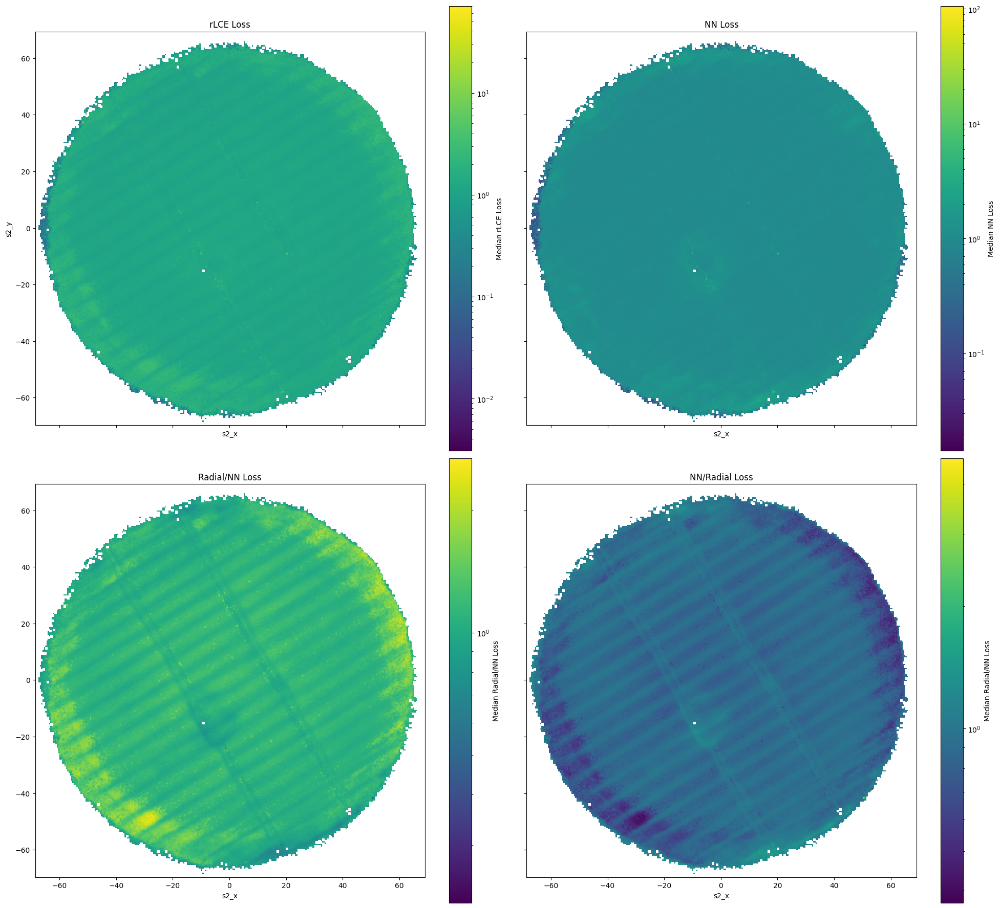

In [29]:
from matplotlib.colors import LogNorm
from scipy.stats import binned_statistic_2d
def tmp():
    bins = 300  # Adjust as needed

    # Extract relevant columns
    x = all_data_df['s2_x'].to_numpy()
    y = all_data_df['s2_y'].to_numpy()
    loss_rLCE = all_data_df['rLCE_Loss'].to_numpy()
    loss_NN = all_data_df['NN_Loss'].to_numpy()

    # Create the figure and subplots
    fig, axes = plt.subplots(2,2, figsize=(20, 18), sharex=True, sharey=True)
    axes=axes.flatten()
    # 2D Histogram for rLCE_Loss
    statistic, x_edges, y_edges, _ = binned_statistic_2d(
        x, y, loss_rLCE, statistic='median', bins=bins
    )
    h1 = axes[0].imshow(statistic.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], cmap='viridis', norm=LogNorm())
    axes[0].set_title("rLCE Loss")
    axes[0].set_xlabel("s2_x")
    axes[0].set_ylabel("s2_y")
    fig.colorbar(h1, ax=axes[0], label="Median rLCE Loss")

    # 2D Histogram for NN_Loss
    statistic, x_edges, y_edges, _ = binned_statistic_2d(
        x, y, loss_NN, statistic='median', bins=bins
    )
    h2 = axes[1].imshow(statistic.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], cmap='viridis', norm=LogNorm())
    axes[1].set_title("NN Loss")
    axes[1].set_xlabel("s2_x")
    fig.colorbar(h2, ax=axes[1], label="Median NN Loss")

    # 2D Histogram for Ratio
    statistic, x_edges, y_edges, _ = binned_statistic_2d(
        x, y, loss_rLCE/loss_NN, statistic='median', bins=bins
    )
    h3 = axes[2].imshow(statistic.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], cmap='viridis', norm=LogNorm())
    axes[2].set_title("Radial/NN Loss")
    axes[2].set_xlabel("s2_x")
    fig.colorbar(h3, ax=axes[2], label="Median Radial/NN Loss")

    # 2D Histogram for Ratio
    statistic, x_edges, y_edges, _ = binned_statistic_2d(
        x, y, loss_NN/loss_rLCE, statistic='median', bins=bins
    )
    h3 = axes[3].imshow(statistic.T, extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], cmap='viridis', norm=LogNorm())
    axes[3].set_title("NN/Radial Loss")
    axes[3].set_xlabel("s2_x")
    fig.colorbar(h3, ax=axes[3],label="Median Radial/NN Loss")


    # Adjust layout and show
    plt.tight_layout()
    plt.show()

tmp()

#### The Wall points are generally higher loss for rLCE 

From the max response plots it appears that the maximum response tends to be larger, and so is the second, however the ratio for the NN is smaller so lets attempt contracting the response range with a new layer 

We use post normalization the functional form:

$$
\text{Doesnt Work: }y = x^p
$$

and then renormalize 

In [60]:
import tensorflow as tf
class PowerLayer(keras.layers.Layer):
    def __init__(self, power=1, **kwargs):
        super().__init__(**kwargs)
        self.power = self.add_weight(
            name="power",                 # Name of the weight
            shape=(),                     # Scalar (no dimensions)
            initializer=tf.constant_initializer(power),
            trainable=True,                # Set it as trainable,
        )

    def build(self, input_shape):
        super().build(input_shape)

    def compute_output_shape(self, input_shape):
        return input_shape

    def call(self, X):
        return tf.pow(X, self.power)

#### And Train

In [72]:
input_x = tf.keras.layers.Input(shape=(2,), name='xx', dtype=tf.float32)
x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
rho = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts]), name='Event_Distance')(x)
#WallDist = GetWallDist((n_alive_pmts, 1),tpc_radius,name="WallDist")(x)
x = RadialLCELayer(guess=rLCE_params, n_groups=1, group_slices=np.arange(n_alive_pmts).reshape(1,-1),name='radial_LCE')(rho)
x = I0Layer(n_alive_pmts, name='i0')(x)

#x = AdjustLCEAnodeShadow(pmt_pos_top[not_dead_pmts],pmt_radius,name='anode_shadow')(input_x, x)

x = NormalizationLayer(name='normalization')(x)
# Apply power law and renormalize
x = PowerLayer(name="PowerLayer")(x)
x = NormalizationLayer(name='normalization_2')(x)
# We pass the full array
input_y = tf.keras.layers.Input(shape=(n_pmts,), name='yy', dtype=tf.float32)
y_mod = FilterAlive(not_dead_pmts, name='aliveFilter')(input_y)
y, chi2 = Likelihood(n_alive_pmts, name='Likelihood')([x, y_mod])
radial_mc_with_power = tf.keras.models.Model(inputs=[input_x, input_y],
                                    outputs=[y, chi2], name='Radial_mc')

radial_mc_with_power.get_layer('i0').set_weights([i0s]) 
radial_mc_with_power.get_layer('i0').trainable = False
radial_mc_with_power.get_layer('PowerLayer').trainable = True
radial_mc_with_power.get_layer('Event_Distance').trainable = False
radial_mc_with_power.get_layer('radial_LCE').trainable = False
radial_mc_with_power.get_layer('Likelihood').trainable = False
radial_mc_with_power.get_layer('Likelihood').set_weights(loss_weights)

def _logl_loss(patterns, likelihood):
    masked_tensor = tf.boolean_mask(likelihood, tf.math.is_finite(likelihood))
    return tf.reduce_mean(masked_tensor)

radial_mc_with_power.compile(
    loss=_logl_loss,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1),
    )
radial_mc_with_power.summary()

Model: "Radial_mc"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xx (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 repeat_vector (RepeatVecto  (None, 246, 2)               0         ['xx[0][0]']                  
 r)                                                                                               
                                                                                                  
 Event_Distance (GetRadius)  (None, 246)                  492       ['repeat_vector[0][0]']       
                                                                                                  
 radial_LCE (RadialLCELayer  (None, 246)                  4         ['Event_Distance[0][0]

In [73]:
patterns = all_data_df.loc[:,'s2_area_per_channel']
patterns = np.vstack(patterns.to_numpy())
positions = ei[['s2_x', 's2_y']].to_numpy()


patterns = tensorflow.convert_to_tensor(patterns[::4,:], dtype=tensorflow.float32)
positions = tensorflow.convert_to_tensor(positions[::4,:], dtype=tensorflow.float32)

n_datapoints = positions.shape[0] 
np.random.seed(1111)
shuffle_i = np.arange(n_datapoints)
np.random.shuffle(shuffle_i)
train_end = int(n_datapoints * 0.8)
train_slice = shuffle_i[0:train_end]
val_slice = shuffle_i[train_end:]

In [74]:
x_train = tensorflow.gather(positions, train_slice, axis=0)
y_train = tensorflow.gather(patterns, train_slice, axis=0)
val = ({'xx': tensorflow.gather(positions, val_slice, axis=0), 
        'yy': tensorflow.gather(patterns, val_slice, axis=0)}, 
       tensorflow.gather(patterns, val_slice, axis=0))


In [75]:
from keras.callbacks import TerminateOnNaN 
term = TerminateOnNaN()
early_stopping = tensorflow.keras.callbacks.EarlyStopping(
    monitor='loss',
    patience=10,        
    restore_best_weights=False,
    min_delta=0.01,
    mode='min',    
    verbose=1      
)
reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(
    monitor='loss',
    mode = 'min',
    restore_best_weights=False,
    factor=0.25,           
    patience=2,            
    min_delta=0.015,        
    min_lr=1e-8,           
    verbose=1              
)
radial_mc_with_power.fit(
    x = {'xx':x_train, 'yy':y_train}, y = y_train, 
    validation_data=val,
    epochs = 100, batch_size = 2**12, 
    callbacks=[term, reduce_lr, early_stopping]
    )

Epoch 1/100
163/163 [==============================] - 30s 174ms/step - loss: 14.4481 - Likelihood_loss: 6.6427 - Likelihood_1_loss: 7.8054 - val_loss: 8.2878 - val_Likelihood_loss: 4.6602 - val_Likelihood_1_loss: 3.6276 - lr: 1.0000
Epoch 2/100
163/163 [==============================] - 28s 170ms/step - loss: 6.7025 - Likelihood_loss: 4.0741 - Likelihood_1_loss: 2.6284 - val_loss: 13.3925 - val_Likelihood_loss: 6.4178 - val_Likelihood_1_loss: 6.9746 - lr: 1.0000
Epoch 3/100
163/163 [==============================] - 28s 169ms/step - loss: 7.6776 - Likelihood_loss: 4.3982 - Likelihood_1_loss: 3.2795 - val_loss: 6.8159 - val_Likelihood_loss: 4.1116 - val_Likelihood_1_loss: 2.7044 - lr: 1.0000
Epoch 4/100
162/163 [============================>.] - ETA: 0s - loss: 6.8054 - Likelihood_loss: 4.1092 - Likelihood_1_loss: 2.6962
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.25.
163/163 [==============================] - 28s 172ms/step - loss: 6.8162 - Likelihood_loss: 4.1126 - Likelih

KeyboardInterrupt: 

In [76]:
radial_mc_with_power.get_layer('PowerLayer').weights

[<tf.Variable 'power:0' shape=() dtype=float32, numpy=0.99609566>]

In [ ]:
loss= radial_mc_with_power.predict({'xx':x_train, 'yy':y_train})[1]

  555/20758 [..............................] - ETA: 1:19

KeyboardInterrupt: 